# Introduction to Computer Vision: Plant Seedlings Classification

## Problem Statement

### Context

In recent times, the field of agriculture has been in urgent need of modernizing, since the amount of manual work people need to put in to check if plants are growing correctly is still highly extensive. Despite several advances in agricultural technology, people working in the agricultural industry still need to have the ability to sort and recognize different plants and weeds, which takes a lot of time and effort in the long term. The potential is ripe for this trillion-dollar industry to be greatly impacted by technological innovations that cut down on the requirement for manual labor, and this is where Artificial Intelligence can actually benefit the workers in this field, as **the time and energy required to identify plant seedlings will be greatly shortened by the use of AI and Deep Learning.** The ability to do so far more efficiently and even more effectively than experienced manual labor, could lead to better crop yields, the freeing up of human inolvement for higher-order agricultural decision making, and in the long term will result in more sustainable environmental practices in agriculture as well.


### Objective

The aim of this project is to Build a Convolutional Neural Netowrk to classify plant seedlings into their respective categories.

### Data Dictionary

The Aarhus University Signal Processing group, in collaboration with the University of Southern Denmark, has recently released a dataset containing **images of unique plants belonging to 12 different species.**

- The dataset can be download from Olympus.
- The data file names are:
    - images.npy
    - Labels.csv
- Due to the large volume of data, the images were converted to the images.npy file and the labels are also put into Labels.csv, so that you can work on the data/project seamlessly without having to worry about the high data volume.

- The goal of the project is to create a classifier capable of determining a plant's species from an image.

**List of Species:**

<table>
 <tr><th>#</th><th>No. of Images</th><th>Description</th></tr>
 <tr><td>1<td>263<td>Black-grass</td></tr>
 <tr><td>2<td>390<td>Charlock</td></tr>
 <tr><td>3<td>287<td>Cleavers</td></tr>
 <tr><td>4<td>611<td>Common Chickweed</td></tr>
<tr><td>5<td>221<td>Common Wheat</td></tr>
<tr><td>6<td>475<td>Fat Hen</td></tr>
<tr><td>7<td>654<td>Loose Silky-bent</td></tr>
<tr><td>8<td>221<td>Maize</td></tr>
<tr><td>9<td>516<td>Scentless Mayweed</td></tr>
<tr><td>10<td>231<td>Shepherds Purse</td></tr>
<tr><td>11<td>496<td>Small-flowered Cranesbill</td></tr>
<tr><td>12<td>385<td>Sugar beet</td></tr>

 </table>

## Importing necessary libraries

In [ ]:
# Installing the libraries with the specified version.
# uncomment and run the following line if Google Colab is being used
!pip install tensorflow==2.15.0 scikit-learn==1.2.2 seaborn==0.13.1 matplotlib==3.7.1 numpy==1.25.2 pandas==1.5.3 opencv-python==4.8.0.76 -q --user

**Note**: *After running the above cell, restart the notebook kernel and run all cells sequentially from the start again.*

In [ ]:
# Essential Libraries
import os                                                                                        # Importing os
import numpy as np                                                                               # Importing numpy for Matrix Operations
import pandas as pd                                                                              # Importing pandas to read CSV files
import matplotlib.pyplot as plt                                                                  # Importting matplotlib for Plotting and visualizing images
import math                                                                                      # Importing math module to perform mathematical operations
import cv2                                                                                       # Importing openCV for image processing
import seaborn as sns                                                                            # Importing seaborn to plot graphs

# Tensorflow modules
import tensorflow as tf                                                                          # Importing Tensorflow
from tensorflow.keras.preprocessing.image import ImageDataGenerator                              # Importing the ImageDataGenerator for data augmentation
from tensorflow.keras.models import Sequential                                                   # Importing the sequential module to define a sequential model
from tensorflow.keras.layers import Dense,Dropout,Flatten,Conv2D,MaxPooling2D,BatchNormalization # Defining all the layers to build our CNN Model
from tensorflow.keras.optimizers import Adam,SGD                                                 # Importing the optimizers which can be used in our model
from sklearn import preprocessing                                                                # Importing the preprocessing module to preprocess the data
from sklearn.model_selection import train_test_split                                             # Importing train_test_split function to split the data into train and test
from sklearn.metrics import confusion_matrix                                                     # Importing confusion_matrix to plot the confusion matrix
from sklearn.preprocessing import LabelBinarizer                                                 # Importing LabelBinarizer

# Display images using OpenCV
from google.colab.patches import cv2_imshow                                                      # Importing cv2_imshow from google.patches to display images
from sklearn.model_selection import train_test_split                                             # Importing train_test_split function to split the data into train and test
from sklearn.metrics import confusion_matrix                                                     # Importing confusion_matrix to plot the confusion matrix
from sklearn.preprocessing import LabelBinarizer                                                 # Importing LabelBinarizer
from tensorflow.keras import backend                                                             # Importing backend from tensorflow.keras
from keras.callbacks import ReduceLROnPlateau                                                    # Importing ReduceLROnPlateau to reduce the learning rate when a metric has stopped improving
import random                                                                                    # Importing random to perform random operations

# Ignore warnings
import warnings
warnings.filterwarnings('ignore')

In [ ]:
# Additional keras functions
from tensorflow import keras
from keras import backend
from keras.models import Sequential
from keras.layers import Dense, Dropout

In [ ]:
# Verifiyng installed versions. - EXTRA CREDIT
print('\nLibraries imported for Exploratory Data Analysis \n(EDA - Univariate and Multivariate):\n')
print("For Numerical Operations and Statistical Analysis of Data:")
print(" . Pandas version:", pd.__version__)
print(" . NumPy version:", np.__version__)
print("\nFor Visualization of Data: ")
print(" . Matplotlib version:", plt.rcParams['figure.figsize'])
print(" . Seaborn version:", sns.__version__)
print("\nFor Machine Learning Models:", tf.__version__)
print(" . Tensorflow version:", tf.__version__)
print(" . Keras version:", keras.__version__)


Libraries imported for Exploratory Data Analysis 
(EDA - Univariate and Multivariate):

For Numerical Operations and Statistical Analysis of Data:
 . Pandas version: 2.2.2
 . NumPy version: 1.26.4

For Visualization of Data: 
 . Matplotlib version: [6.4, 4.8]
 . Seaborn version: 0.13.2

For Machine Learning Models: 2.17.0
 . Tensorflow version: 2.17.0
 . Keras version: 3.4.1


In [ ]:
# Identify GPU Processing Resources with current runtime
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

Thu Nov 14 01:00:15 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   74C    P0              33W /  70W |    111MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

## Loading the dataset

In [ ]:
from google.colab import drive
drive.mount('/content/drive')                # Mount Drive

Mounted at /content/drive



Check if the actual size matches the expected size

In [ ]:
# Load the IMAGE file of dataset
images = np.load('/content/images.npy')      # Load images.npy dataset array
print(images.shape)  # Print the shape of the array to verify loading

# Calculate the expected size based on the desired shape
expected_size = 4750 * 128 * 128 * 3

# Print the actual size and the expected size
print("Actual size of the array:", images.size)
print("Expected size of the array:", expected_size)
print("4750 arrays * 128 l * 128 w * 3 color channels\n")

# Check if the actual size matches the expected size
if images.size == expected_size:
    images = images.reshape(4750, 128, 128, 3)  # Reshape if sizes match
    print("images dataset shape:", images.shape, " <--- Plant image in Pixels Array representation")   # Check the images shape
else:
    print("Error: The actual size of the array does not match the expected size.")
    print("Please check the dimensions of your images and the specified shape.")

# Load the LABELS file of dataset
labels = pd.read_csv('/content/Labels.csv')  # Load Labels.csv dataset
print("labels dataset shape:", labels.shape, "<--- Plant Labels")   # Check the labels shape

(4750, 128, 128, 3)
Actual size of the array: 233472000
Expected size of the array: 233472000
4750 arrays * 128 l * 128 w * 3 color channels

images dataset shape: (4750, 128, 128, 3)  <--- Plant image in Pixels Array representation
labels dataset shape: (4750, 1) <--- Plant Labels


Observations:
-  There are 4,750 images with their corresponding labels.
-  The size of the images are 128 x 128 pixels (l x w) with a depth of 3 (RGB) channels (Red, Green, Blue).
-  There are 4750 images in the images dataset and 4750 labesl in the labes dataset.


In [ ]:
def plot_images(images,labels):                                                   # Function to plot images with corresponding labels
  num_classes=10                                                                  # Number of Classes
  categories=np.unique(labels)                                                    # Obtaing the unique classes from y_train
  keys=dict(labels['Label'])                                                      # Obtaing the unique classes from y_train
  rows = 3                                                                        # Defining number of rows=3
  cols = 4                                                                        # Defining number of columns=4
  fig = plt.figure(figsize=(10, 8))                                               # Defining the figure size to 10x8
  for i in range(cols):
      for j in range(rows):
          random_index = np.random.randint(0, len(labels))                        # Generating random indices from the data and plotting the images
          ax = fig.add_subplot(rows, cols, i * rows + j + 1)                      # Adding subplots with 3 rows and 4 columns
          ax.imshow(images[random_index, :])                                      # Plotting the image
          ax.set_title(keys[random_index])                                        # Setting the title of the plot to the corresponding label
  plt.show()                                                                      # Showing the plot


Plant labels displayed first, present a grid with 3 rows by 4 columns with (12) plant images 
madeup by (12) 128 x 128 (l x w) pixel arrays and 3 color (GBR) channels:



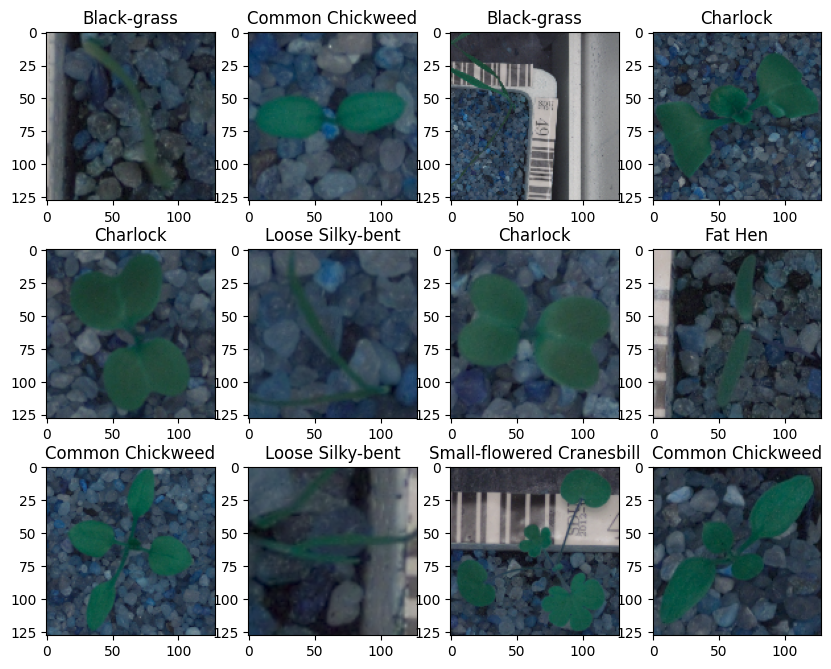

In [ ]:
# images and labels alignments using the plot_images function above
# to plot the images with their corresponding labels:
print("\nPlant labels displayed first, present a grid with 3 rows by 4 columns with (12) plant images \nmadeup by (12) 128 x 128 (l x w) pixel arrays and 3 color (GBR) channels:\n")
plot_images(images, labels)

## Data Overview

### Shape of the datasets

In [ ]:
# Load the IMAGE file of dataset
images = np.load('/content/images.npy')      # Load images.npy dataset array
print("\033[1;32mimages\033[0m dataset shape:", images.shape, " <--- Plant image in 128x128 Pixels Array representation with 3 color channels.")   # Check the images shape
# Load the LABELS file of dataset
labels = pd.read_csv('/content/Labels.csv')  # Load Labels.csv dataset
print("\033[1;32mlabels\033[0m dataset shape:", labels.shape, "<--- Plant Labels, 1 column with 4,750 plant labels.")   # Check the labels shape

images dataset shape: (4750, 128, 128, 3)  <--- Plant image in 128x128 Pixels Array representation with 3 color channels.
labels dataset shape: (4750, 1) <--- Plant Labels, 1 column with 4,750 plant labels.


## Exploratory Data Analysis

In [ ]:
# Extract the unique categories and their counts
category_counts = labels['Label'].value_counts()

# Calculate the percentage of each category and round to 2 significant digits
category_percentage = (category_counts / category_counts.sum() * 100).round(2)

# Find the smallest percentage
min_percentage = category_percentage.min()

# Calculate the factor for each category based on the smallest percentage
factor_based_on_min_percentage = (category_percentage / min_percentage).round(2)

# Combine counts, percentages, and factor into a single DataFrame
category_summary = pd.DataFrame({
    'Count': category_counts,
    'Percentage': category_percentage,
    'xFactor': factor_based_on_min_percentage
})

# Print the DataFrame
category_summary

,Count,Percentage,xFactor
Label,,,
Loose Silky-bent,654,13.77,2.96
Common Chickweed,611,12.86,2.77
Scentless Mayweed,516,10.86,2.34
Small-flowered Cranesbill,496,10.44,2.25
Fat Hen,475,10.00,2.15
Charlock,390,8.21,1.77
Sugar beet,385,8.11,1.74
Cleavers,287,6.04,1.30
Black-grass,263,5.54,1.19


Observations:
  -  There are 12 different categories (unique labels) of images.
  -  Their category distribution ranges from 221 - 654 plants in this dataset.
  -  The category distribution by percentages range from 4.65% to 13.77%.
  -  The categories are not evenly distributed (somewhat unbalanced) and this could negatively affect the training of the model. Additional compensations will likely be needed.

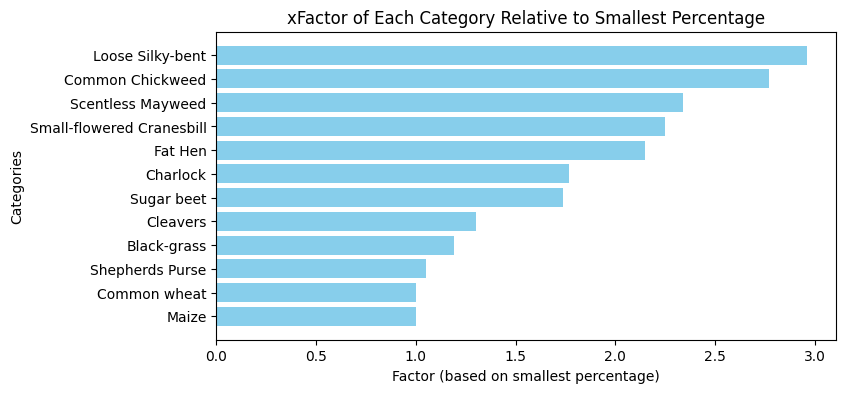

In [ ]:
# Plotting the times factor for each category
plt.figure(figsize=(8, 4))
plt.barh(category_summary.index, category_summary['xFactor'], color='skyblue')
plt.xlabel('Factor (based on smallest percentage)')
plt.ylabel('Categories')
plt.title('xFactor of Each Category Relative to Smallest Percentage')
plt.gca().invert_yaxis()  # Invert y-axis for better readability
plt.show()

Observations:
-  Minority categories Maize and Common Wheat are 3x fewer than Loose Silky-bent and Common Chickweed creating a potential umbalance.


Recommendations:
-  To better handle this umbalance of images, we could adjust Class Weighing in the loss function to emphasize the minority classes, we could also apply transformations (rotations, color adjustments) to minority classes, and we could even try to fine tune a VGG model against this datasets.

- Additional strategies for handling imbalanced datasets:
	1.	**Resampling**: Use oversampling or undersampling for balance; try SMOTE for synthetic samples.
	2.	**Class Weighting**: Adjust loss weights or use focal loss to emphasize minority classes.
	3.	**Data Augmentation**: Apply transformations to minority data to increase diversity.
	4.	**Balanced Batching**: Ensure balanced class representation in mini-batches.
	5.	**Ensemble**: Combine models trained on balanced subsets.
	6.	**Transfer Learning**: Fine-tune pre-trained models to mitigate imbalance.
	7.	**Evaluation**: Use F1, precision-recall, and ROC-AUC instead of accuracy.

### Plotting random images from each of the class

In [ ]:
def plot_images(images,labels):
  num_classes=10                                                                  # Number of Classes
  categories=np.unique(labels)
  keys=dict(labels['Label'])                                                      # Obtaing the unique classes from y_train
  rows = 3                                                                        # Defining number of rows=3
  cols = 4                                                                        # Defining number of columns=4
  fig = plt.figure(figsize=(10, 8))                                               # Defining the figure size to 10x8
  for i in range(cols):
      for j in range(rows):
          random_index = np.random.randint(0, len(labels))                        # Generating random indices from the data and plotting the images
          ax = fig.add_subplot(rows, cols, i * rows + j + 1)                      # Adding subplots with 3 rows and 4 columns
          ax.imshow(images[random_index, :])                                      # Plotting the image
          ax.set_title(keys[random_index])
  plt.show()


Plant labels displayed first, (12) plant images madeup by (12) 128 in height x 128 in width 
pixel arrays and (BRG) 3 color channels:



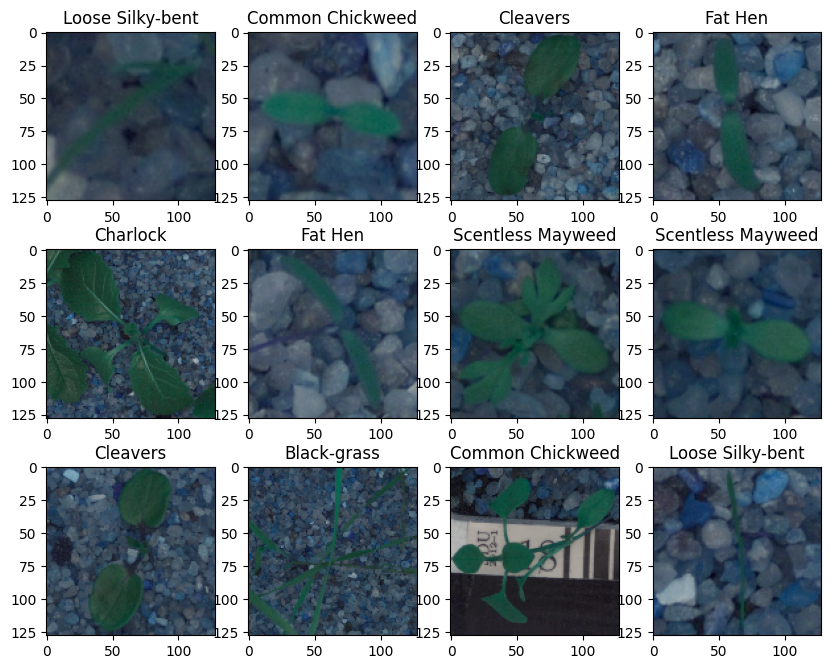

In [ ]:
# images and labels alignments using the plot_images function
# plot the images with their corresponding labels
print("\nPlant labels displayed first, (12) plant images madeup by (12) 128 in height x 128 in width \npixel arrays and (BRG) 3 color channels:\n")
plot_images(images, labels)

### Observing the distribution of the image categories (target variable to predict)

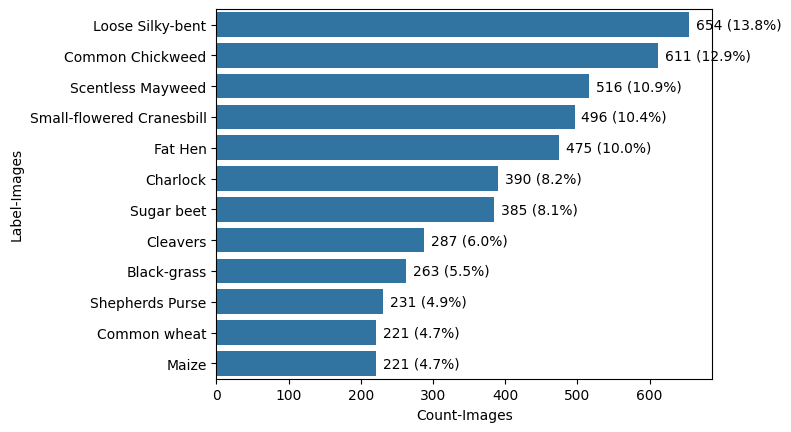

In [ ]:
# Sort labels in descending order by count
sorted_labels = labels['Label'].value_counts().index

# Check for data imbalance with labels on y-axis in descending order
ax = sns.countplot(y=labels['Label'], order=sorted_labels)
total = len(labels)

# Annotate each bar with the count and relative percentage
for container in ax.containers:
    for bar in container:
        width = bar.get_width()
        count = int(width)
        percentage = f'{(width / total) * 100:.1f}%'
        ax.annotate(f'{count} ({percentage})',
                    xy=(width, bar.get_y() + bar.get_height() / 2),
                    xytext=(5, 0),  # Offset the text slightly to the right of the bar
                    textcoords="offset points",
                    ha='left', va='center')

plt.xlabel('Count-Images')
plt.ylabel('Label-Images')
plt.show()

Class balance. Check each class should have roughly between 80-120% of the number of samples as the other classes:

In [ ]:
def check_class_balance(labels, label_column='Label'):
    """
    Identifies the level of class balance in a dataset based on predefined guidelines.

    Parameters:
    - labels (DataFrame or Series): Dataset containing the class labels.
    - label_column (str): The name of the column containing class labels (if `labels` is a DataFrame).

    Returns:
    - str: The level of balance (balanced, mildly imbalanced, heavily imbalanced, or extremely imbalanced).
    """

    # Get class counts
    if isinstance(labels, pd.DataFrame):
        class_counts = labels[label_column].value_counts()
    elif isinstance(labels, pd.Series):
        class_counts = labels.value_counts()
    else:
        raise ValueError("`labels` should be a DataFrame or Series.")

    # Calculate the ratio between the max and min class counts
    max_count = class_counts.max()
    min_count = class_counts.min()
    ratio = max_count / min_count

    # Define thresholds based on guidelines
    if ratio <= 1.2:
        balance_status = "Balanced"
    elif 1.2 < ratio <= 3:
        balance_status = "Mildly Imbalanced"
    elif 3 < ratio <= 5:
        balance_status = "Heavily Imbalanced"
    else:
        balance_status = "Extremely Imbalanced"

    # Print the summary and return the balance status
    # print(f"Class counts:\n{class_counts}\n")
    print(f"Max class count: {max_count}")
    print(f"Min class count: {min_count}")
    print(f"Class ratio (max/min): {ratio:.2f}")
    print(f"Balance status: \033[33m{balance_status}\033[0m")

    return balance_status

# Example usage:
# Assuming `labels` is a DataFrame with a column 'Label' that contains the class labels
balance_status = check_class_balance(labels, label_column='Label')

# Chosen criteria with ANSI formatting for bold and red text
print("\nChosen Criteria Threshold:")
print("\033[33meach class should have roughly between 80-120% of the number of samples as the other classes.\033[0m")

Max class count: 654
Min class count: 221
Class ratio (max/min): 2.96
Balance status: Mildly Imbalanced

Chosen Criteria Threshold:
each class should have roughly between 80-120% of the number of samples as the other classes.


Observations:

- There are 12 categories of images.
- There are 4,750 images in the dataset.
- The dataset shows a slight imbalance of categories, with the minority class (Maize & Common Wheat) having 221 samples and the majority class (Loose Silky-bent) having 654 images.

NOTE: A common guidance is that each class should have roughly 80-120% of the sample size of the others.

To address an slight imbalance, during model building we could include the following:

- Performance metrics: Use F1 score, precision, recall, and AUC-PR to evaluate how well the model handles each class.
- Balance evaluation: Apply (1) oversampling, (2) undersampling, or (3) class weights **to see if model performance improves with a more balanced data**.

While slight imbalances are often acceptable, <font color=orange>if the minority class is critical, such as identifying a plant with a rare toxin present, —a higher accuracy for the minority class becomes essential</font> and the model should be build accordingly. The use case dictactes the direction and focus.

## Data Pre-Processing

### Convert the BGR images to RGB images

In [ ]:
# Iterates through and converts each image from BGR to RGB using cvtColor function of OpenCV.

import cv2

images_rgb = []
for i in range(len(images)):
    image_rgb = cv2.cvtColor(images[i], cv2.COLOR_BGR2RGB)
    images_rgb.append(image_rgb)

images_rgb = np.array(images_rgb) # Convert back to NumPy array
# Now 'images_rgb' contains the images in RGB format.  We can use this
# array in the rest of the code instead of the original 'images' BRG array.
print("\nImages converted from BGR to RGB still with their original dimensions 128 x 128 (\033[33mimages_rgb\033[0m)")


Images converted from BGR to RGB still with their original dimensions 128 x 128 (images_rgb)


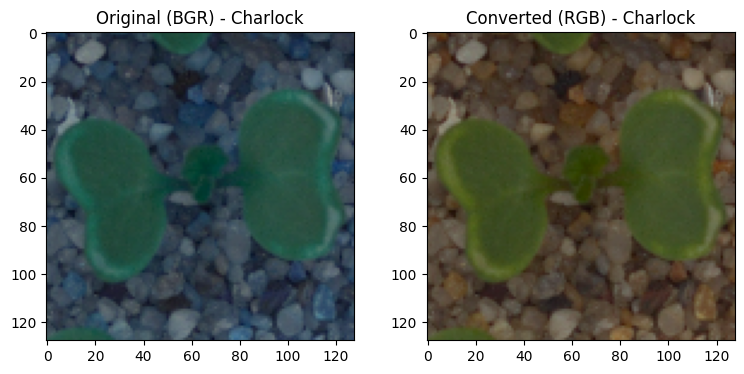

In [ ]:
# Print one image in the original GRB and its corresponding image in RGB and their labels adjacent to each other

import matplotlib.pyplot as plt
import numpy as np
import cv2

# Function to display BGR original image vs RGB
def plot_original_and_rgb(images, images_rgb, labels):
    # Select a random index
    random_index = np.random.randint(0, len(labels))

    # Plot original image (BGR)
    plt.figure(figsize=(9, 4))
    plt.subplot(1, 2, 1)
    plt.imshow(images[random_index])  # Matplotlib handles BGR
    plt.title(f"Original (BGR) - {labels['Label'][random_index]}")


    # Plot converted image (RGB)
    plt.subplot(1, 2, 2)
    plt.imshow(images_rgb[random_index])
    plt.title(f"Converted (RGB) - {labels['Label'][random_index]}")

    plt.show()

# Show one
plot_original_and_rgb(images, images_rgb, labels)

### Resizing images without loosing image details from 128x128 down to 64x64

Considering the size of the images, it may be computationally expensive to train on these 128 x 128 images.  We can investigate the type of results when we reduce the image size in 1/2 from 128x128 down to 64 x 64 and see that we do not loose critical image details to predict their labels.

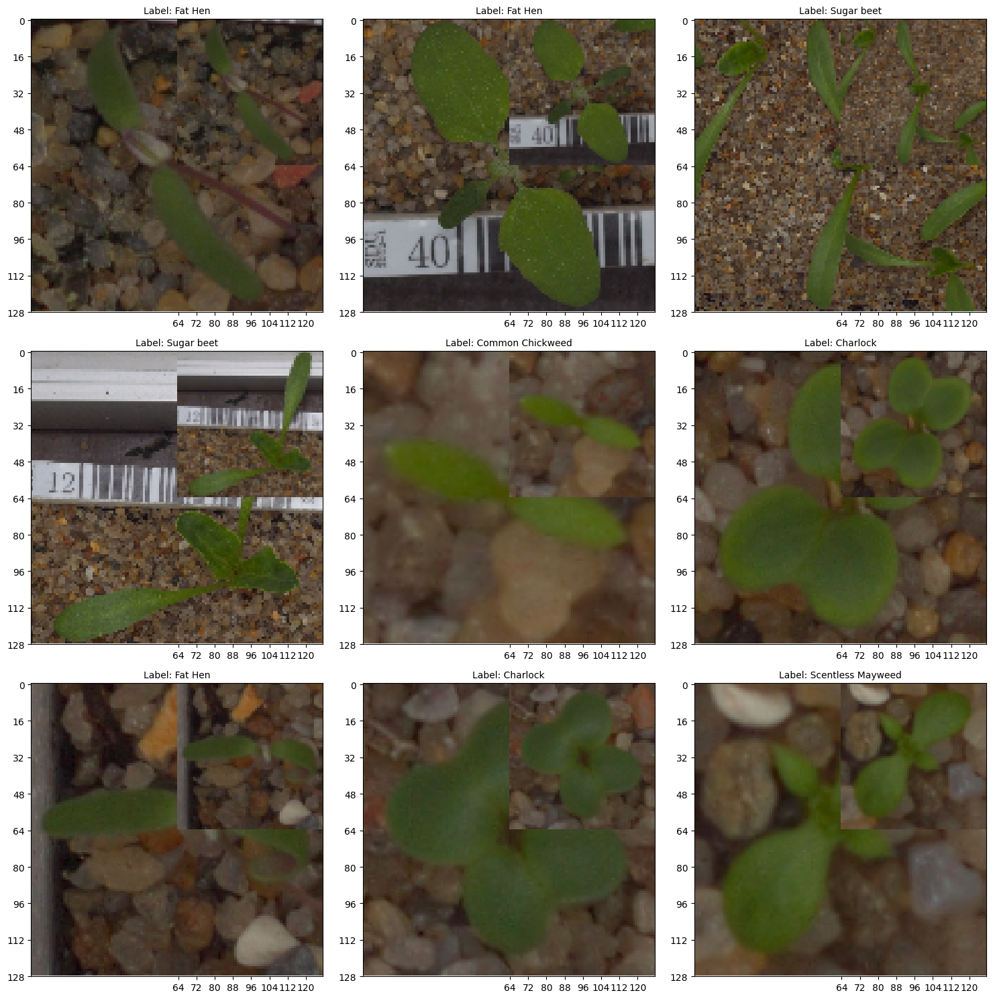

In [ ]:
# Resize images_rgb to 64x64 and view their original images_rgb

import matplotlib.pyplot as plt
import numpy as np
import cv2

def display_resized_images_corner(images_rgb, labels):
    resized_images = []
    for img in images_rgb:
        resized_img = cv2.resize(img, (64, 64))
        resized_images.append(resized_img)
    resized_images = np.array(resized_images)

    fig, axes = plt.subplots(3, 3, figsize=(15, 15))
    for i in range(3):
        for j in range(3):
            index = np.random.randint(0, len(images_rgb))  # Random image index
            original_image = images_rgb[index].copy()
            resized_image = resized_images[index]

            # Calculate the position to place the resized image in the top right corner
            x_offset = original_image.shape[1] - resized_image.shape[1]
            y_offset = 0  # Top corner

            # Overlay the resized image onto the original image
            original_image[y_offset:y_offset + resized_image.shape[0], x_offset:x_offset + resized_image.shape[1]] = resized_image

            axes[i, j].imshow(original_image)
            axes[i, j].set_title(f"Label: {labels['Label'][index]}", fontsize=10)
            axes[i, j].set_yticks(np.arange(0, 129, 16)) # 128 tick marks

            #Adding ticks for the resized image (64x64) within the larger image
            axes[i, j].set_xticks(np.arange(x_offset, original_image.shape[1], 8)) # 64 tick marks

    plt.tight_layout()
    plt.show()

# Assuming images_rgb and labels are defined from the previous code
display_resized_images_corner(images_rgb, labels)

**NOTICE:**

- <font color = violet>Smaller 64x64 images were placed inside the original image (128x128) at the upper right side corner for comparisons.
>> **Examine each image has no detectable loss of details - despite its reduction in size. ^^**


 Display another 12 images, original vs resized:



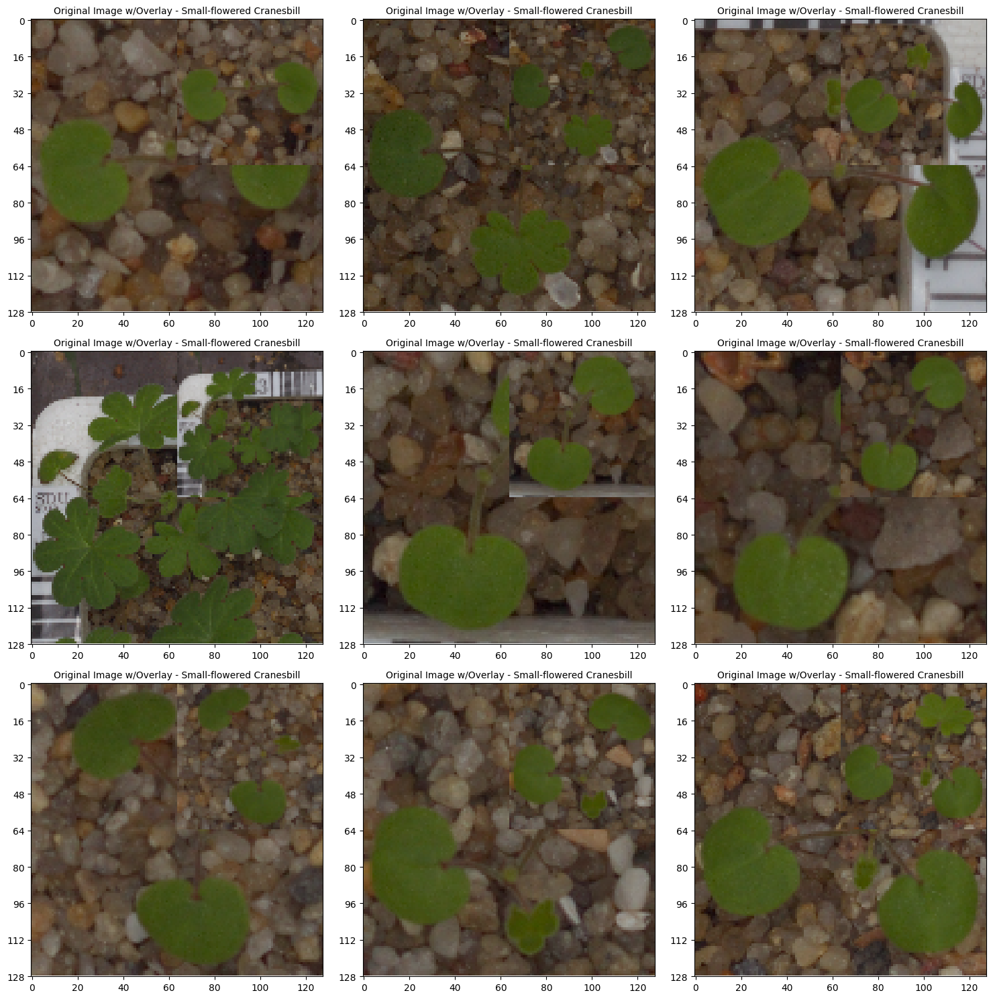

In [ ]:
print("\n Display another 12 images, original vs resized:\n")
display_resized_images_overlay(images_rgb, labels)

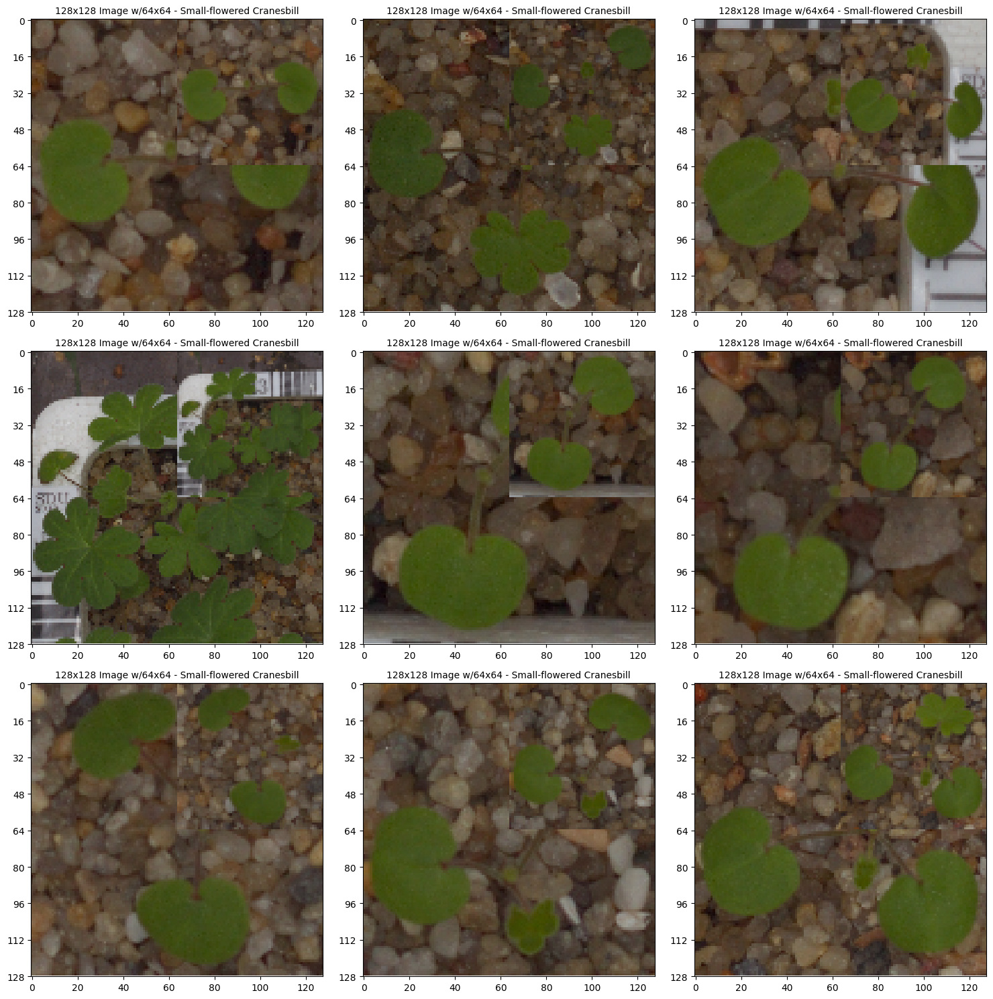

In [ ]:
def display_resized_images_overlay(images_rgb, labels):
    resized_images = []
    for img in images_rgb:
        resized_img = cv2.resize(img, (64, 64))
        resized_images.append(resized_img)
    resized_images = np.array(resized_images)

    fig, axes = plt.subplots(3, 3, figsize=(15, 15))
    for i in range(3):
        for j in range(3):
            index = i * 3 + j
            if index < len(images_rgb):
                # Overlay the resized image onto the original image
                overlay_image = images_rgb[index].copy()
                x_offset = images_rgb[index].shape[1] - 64
                y_offset = 0  # Place in the upper right corner
                overlay_image[y_offset:y_offset + 64, x_offset:x_offset + 64] = resized_images[index]

                axes[i, j].imshow(overlay_image)
                axes[i, j].set_title(f"128x128 Image w/64x64 - {labels['Label'][index]}", fontsize=10)
                axes[i, j].set_yticks(np.arange(0, 129, 16))

    plt.tight_layout()
    plt.show()

display_resized_images_overlay(images_rgb, labels)

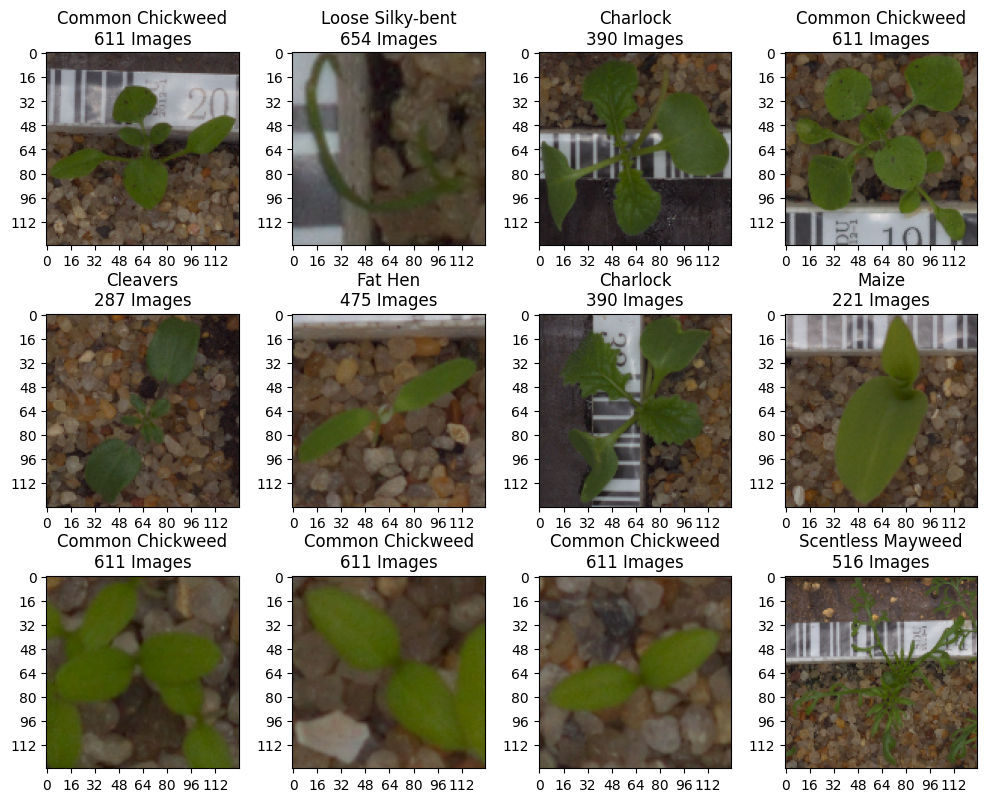


                                  Notice the image axis decreased from 128 down to 64:



In [ ]:
# Create the label_dict to store counts of each label
label_dict = labels['Label'].value_counts().to_dict()

# Function to plot images with labels and corresponding value counts
def plot_images_with_value_counts(images, labels, label_dict):
    rows = 3  # Number of rows in the plot
    cols = 4  # Number of columns in the plot
    fig = plt.figure(figsize=(10, 8))  # Set figure size

    # Loop through rows and columns to plot images
    for i in range(rows):
        for j in range(cols):
            random_index = np.random.randint(0, len(images))  # Randomly select an index
            ax = fig.add_subplot(rows, cols, i * cols + j + 1)  # Add subplot in a grid
            ax.imshow(images[random_index])  # Plot the image

            # Get the label and count for the randomly selected image
            label = labels.iloc[random_index, 0]  # Access the first column of the DataFrame
            label_count = label_dict.get(label, 0)  # Get the count for this label from label_dict

            # Set title with label and its count
            ax.set_title(f"{label}\n{label_count} Images")

            # Set ticks for the x and y axis from 0 to 64
            ax.set_xticks(np.arange(0, 128, 16))
            ax.set_yticks(np.arange(0, 128, 16))
            ax.set_xticklabels(np.arange(0, 128, 16))
            ax.set_yticklabels(np.arange(0, 128, 16))

    plt.tight_layout()  # Ensure proper spacing between subplots
    plt.show()

# Display RGB images with labels and label counts
plot_images_with_value_counts(images_rgb, labels, label_dict)

# Print request for observation
print("\n                                  Notice the image axis decreased from 128 down to 64:\n")

Observations:
- Some images seem somewhat blurred at 64, but their prominent characteristics remain.
- You can observe the size of the array (shape of the matrix) is 64 x 64 pixels. (l x h)
- 12 images get displayed randomly.

### Compare some images before and after resizing

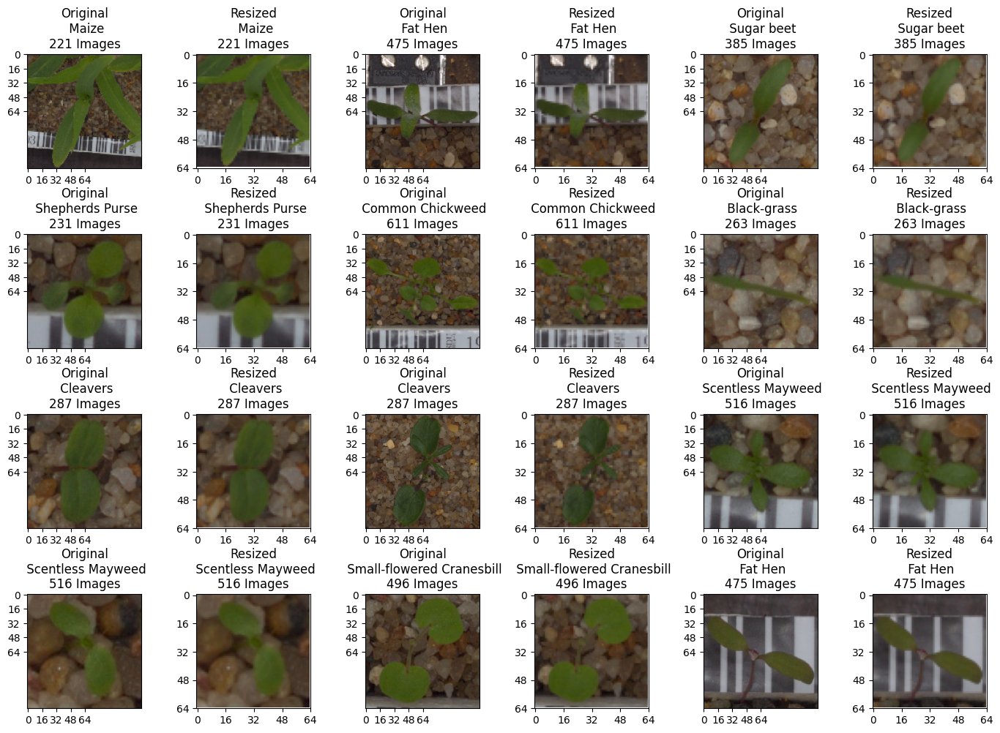

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Assuming 'images' and 'labels' are already loaded into your environment
# Replace 'images' and 'labels' with your actual image and label data

# Resize images from 128x128 to 64x64
images_resized = []
height = 64
width = 64
dimensions = (width, height)
for i in range(len(images)):
    resized_image = cv2.resize(images[i], dimensions, interpolation=cv2.INTER_LINEAR)
    images_resized.append(resized_image)

images_resized = np.array(images_resized)  # Convert to a NumPy array

# Convert both original and resized images from BGR to RGB
images_rgb = []
images_resized_rgb = []
for i in range(len(images)):
    image_rgb = cv2.cvtColor(images[i], cv2.COLOR_BGR2RGB)
    images_rgb.append(image_rgb)
    resized_image_rgb = cv2.cvtColor(images_resized[i], cv2.COLOR_BGR2RGB)
    images_resized_rgb.append(resized_image_rgb)

images_rgb = np.array(images_rgb)  # Original images in RGB format
images_resized_rgb = np.array(images_resized_rgb)  # Resized images in RGB format

# Count the value frequency of labels (number of occurrences of each label)
label_counts = np.unique(labels, return_counts=True)  # Get unique labels and their counts
label_dict = dict(zip(label_counts[0], label_counts[1]))  # Create a dictionary for label counts

# Function to plot both original and resized images with labels and corresponding value counts
def plot_images_with_value_counts(original_images, resized_images, labels):
    rows = 4  # Number of rows in the plot
    cols = 3  # Number of columns in the plot
    fig = plt.figure(figsize=(14,10))  # Increase figure size to accommodate side-by-side images

    # Loop through rows and columns to plot images
    for i in range(cols):
        for j in range(rows):
            random_index = np.random.randint(0, len(original_images))  # Randomly select an index
            # Add subplot for original image
            ax = fig.add_subplot(rows, cols * 2, (i * rows + j) * 2 + 1)
            ax.imshow(original_images[random_index])  # Plot the original image
            ax.axis('on')  # Turn on axes

            # Get the label and count for the randomly selected image
            label = labels[random_index]  # Access the label using the random index
            label_count = label_dict.get(label, 0)  # Get the count for this label from label_dict

            # Set title with label and its count for original image
            ax.set_title(f"Original\n {label}\n{label_count} Images")

            # Add subplot for resized image
            ax_resized = fig.add_subplot(rows, cols * 2, (i * rows + j) * 2 + 2)
            ax_resized.imshow(resized_images[random_index])  # Plot the resized image
            ax_resized.axis('on')  # Turn on axes

            # Set title with label and its count for resized image
            ax_resized.set_title(f"Resized\n {label}\n{label_count} Images")

            # Set ticks for the x and y axis from 0 to 64 (same for both)
            ax.set_xticks(np.arange(0, 65, 16))  # Set x-axis ticks at intervals of 16 (up to 64)
            ax.set_yticks(np.arange(0, 65, 16))  # Set y-axis ticks at intervals of 16 (up to 64)
            ax_resized.set_xticks(np.arange(0, 65, 16))
            ax_resized.set_yticks(np.arange(0, 65, 16))

            # Label the ticks (matches the tick positions)
            ax.set_xticklabels(np.arange(0, 65, 16))
            ax.set_yticklabels(np.arange(0, 65, 16))
            ax_resized.set_xticklabels(np.arange(0, 65, 16))
            ax_resized.set_yticklabels(np.arange(0, 65, 16))

    plt.tight_layout()  # Ensure proper spacing between subplots
    plt.show()

# Display both original and resized RGB images with labels and label counts
plot_images_with_value_counts(images_rgb, images_resized_rgb, labels)

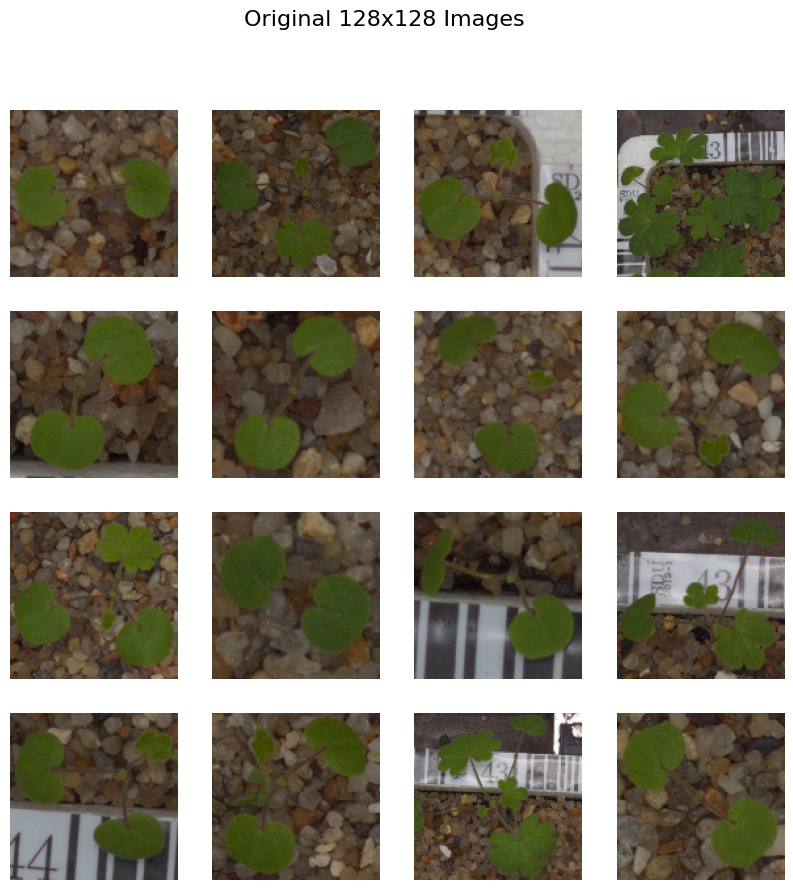

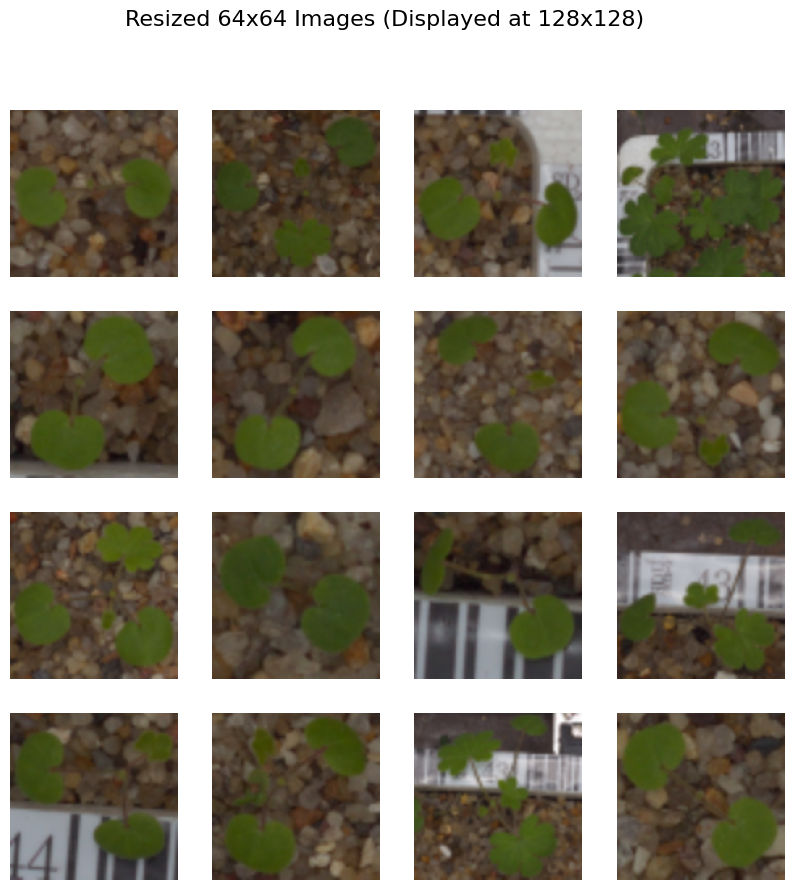

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Convert images from BGR to RGB and resize to 64x64
images_rgb_128 = []
images_rgb_64 = []

for i in range(len(images)):
    # Convert to RGB
    image_rgb = cv2.cvtColor(images[i], cv2.COLOR_BGR2RGB)
    images_rgb_128.append(image_rgb)  # Original 128x128 images

    # Resize to 64x64
    image_resized = cv2.resize(image_rgb, (64, 64))
    images_rgb_64.append(image_resized)  # Resized 64x64 images

# Convert lists back to NumPy arrays
images_rgb_128 = np.array(images_rgb_128)
images_rgb_64 = np.array(images_rgb_64)

# Function to plot a grid of 16 images
def plot_images(images, title, size=(128, 128)):
    plt.figure(figsize=(10, 10))
    for i in range(16):
        plt.subplot(4, 4, i + 1)
        plt.imshow(images[i] if size == (128, 128) else cv2.resize(images[i], (128, 128)))
        plt.axis('off')
    plt.suptitle(title, fontsize=16)
    plt.show()

# Display the original 128x128 images
plot_images(images_rgb_128, "Original 128x128 Images", size=(128, 128))

# Display the resized 64x64 images (scaled back up to 128x128 for easy comparison)
plot_images(images_rgb_64, "Resized 64x64 Images (Displayed at 128x128)", size=(64, 64))

### **Taking a closer look at a couple of images before resizing and after:**


                                                             NOTICE (axes tick marks):
.                                      Pixel size (l x w) was cut in half but essential characteristics remain:
 


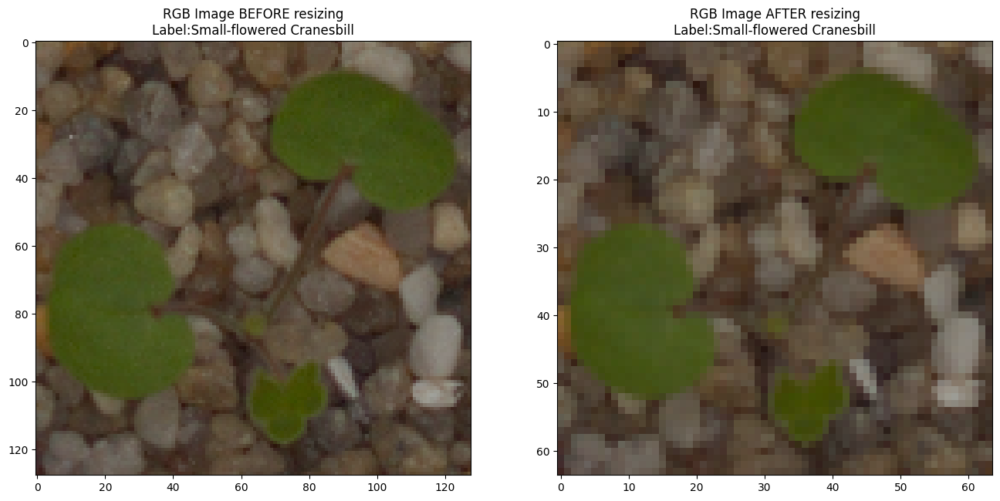

In [ ]:
print("\n                                                             NOTICE (axes tick marks):")
print("                                      Pixel size (l x w) was cut in half but essential characteristics remain:\n ")

# Display both images side-by-side
plt.figure(figsize=(16,8))

# Show the original image
plt.subplot(1, 2, 1)
plt.title(f"RGB Image BEFORE resizing\nLabel:{labels[7]}")
plt.imshow(images_rgb[7])

# Show the resized image
plt.subplot(1, 2, 2)
plt.title("Image after resizing")
plt.title(f"RGB Image AFTER resizing\nLabel:{labels[7]}")
plt.imshow(images_resized_rgb[7])

plt.show()


                                                             NOTICE (axes tick marks):
.                                      Pixel size (l x w) was cut in half but essential characteristics remain:
 


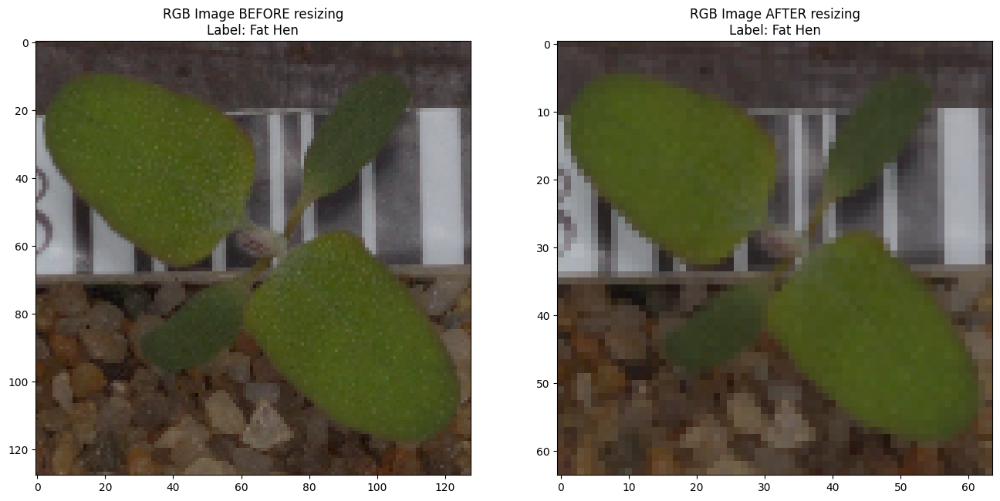

In [ ]:
print("\n                                                             NOTICE (axes tick marks):")
print(".                                      Pixel size (l x w) was cut in half but essential characteristics remain:\n ")

# Display both images side-by-side
plt.figure(figsize=(16, 8))

# Show the original image
plt.subplot(1, 2, 1)
plt.title(f"RGB Image BEFORE resizing\nLabel: {labels[500]}")
plt.imshow(images_rgb[500])

# Show the resized image
plt.subplot(1, 2, 2)
plt.title(f"RGB Image AFTER resizing\nLabel: {labels[500]}")  # Set title with the corresponding label
plt.imshow(images_resized_rgb[500])

plt.show()

### Data Preparation for Modeling


- We will use 10% of our data for testing, 10% of our data for validation and 80% of our data for training.
- We are using the train_test_split() function from scikit-learn to split the dataset into three datasets, training, validation and testing.
- The performance will be measured on the validation and eventually the test datasets.

In [ ]:
# We split the dataset into three parts, Training, Validating and Testing datasets.
from sklearn.model_selection import train_test_split

# images_rgb_64 - numpy array
X_train, X_test, y_train, y_test = train_test_split(images_rgb_64, labels, test_size=0.1, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.111, random_state=42) # 0.111 x 0.9 = 0.1
# Now we have:
# - X_train, y_train: Training data and labels (80% of the original data)
# - X_val, y_val: Validation data and labels (10% of the original data)
# - X_test, y_test: Testing data and labels (10% of the original data)

In [ ]:
# Check the shape of train, validation and test data
print("\nShape of training dataset:")
print(np.array(X_train).shape,np.array(y_train).shape) # Convert X_train and y_train to NumPy arrays before accessing shape
print("\nShape of validation dataset:")
print(np.array(X_val).shape,np.array(y_val).shape)   # Convert X_val and y_val to NumPy arrays before accessing shape
print("\nShape of testing dataset:")
print(np.array(X_test).shape,np.array(y_test).shape)  # Convert X_test and y_test to NumPy arrays before accessing shape


Shape of training dataset:
(3800, 64, 64, 3) (3800, 1)

Shape of validation dataset:
(475, 64, 64, 3) (475, 1)

Shape of testing dataset:
(475, 64, 64, 3) (475, 1)


### Encoding the target labels

In [ ]:
# Convert labels from names to one hot vectors.
# We have already used encoding methods like
# - onehotencoder
# - abelencoder
# Now we will be using a new encoding method called: labelBinarizer.
# Labelbinarizer works similar to onehotencoder

print("\nWe will use encoding method: labelBinarizer")
print("labelbinarizer works similar to onehotencoder")

from sklearn.preprocessing import LabelBinarizer

enc = LabelBinarizer()                              # Complete the code to intialize the labelBinarizer
y_train_encoded = enc.fit_transform(y_train)        # Complete the code to fit and transform y_train
y_val_encoded=enc.transform(y_val)                  # Complete the code to transform y_val
y_test_encoded=enc.transform(y_test)                # Complete the code to transform y_test


We will use encoding method: labelBinarizer
labelbinarizer works similar to onehotencoder


In [ ]:
print("Check the shape of train, validation and test data:")
print(y_train_encoded.shape,y_val_encoded.shape,y_test_encoded.shape) # Check the shape of train, validation and test data
print("\nShape of training dataset:",np.array(y_train_encoded).shape) # Convert X_train and y_train to NumPy arrays before accessing shape
print("\nShape of validation dataset:",np.array(y_val_encoded).shape) # Convert X_val and y_val to NumPy arrays before accessing shape
print("\nShape of testing dataset:",np.array(y_test_encoded).shape)   # Convert X_test and y_test to NumPy arrays before accessing shape

Check the shape of train, validation and test data:
(3800, 12) (475, 12) (475, 12)

Shape of training dataset: (3800, 12)

Shape of validation dataset: (475, 12)

Shape of testing dataset: (475, 12)


### Data Normalization

Since the **image pixel values range from 0-255**, our method of normalization here will be **scaling**
- **divide all the pixel values by 255 to standardize the images to have values between 0-1.**

In [ ]:
# Since the image pixel values range from 0-255, our method of normalization here will be scaling - we shall divide all the pixel values by 255 to standardize the images to have values between 0-1.

# Normalize the image pixels of train, test and validation data
X_train_normalized = np.array(X_train) / 255.0
X_val_normalized = np.array(X_val) / 255.0
X_test_normalized = np.array(X_test) / 255.0

## Model Building

In [ ]:
# Clearing backend:
backend.clear_session()

In [ ]:
# Fixing the seed for random number generators:
np.random.seed(42)
random.seed(42)
tf.random.set_seed(42)

In [ ]:
# Purpose: Initializes a Sequential model, which allows us to stack layers in a linear order, from input to output.
#
#      This model setup combines 3 convolutional layers, 3 corresponding pooling layers, and fully connected layers with
#      an optimizer compiling with a loss function suitable for multi-class classification to create
#      a sequential structure that can learn hierarchical features from images for classification.

model1 = Sequential()  # Initialize the sequential model

# ------------------------------ 1st --------------------------------------|
# Add first convolutional layer with 128 filters, kernel size 3x3, and 'same' padding:
# The input_shape defines the dimensions of the input image that the model expects.
# This input shape is independent of the number of filters in the convolutional layer.
# Depth changes -only- with convolutional layers based on the number of filters.
# >>  Input Shape: (64, 64, 3) (height, width, color channels). Here, 64x64 is the image dimension, and 3 channels represent RGB color.
#      •	Filters: 128, meaning the layer will learn 128 different features of the image using the following configuration.
#      •	Kernel Size: (3, 3), which determines that each filter will slide over a 3x3 region at a time.
#      •	Padding: "same" ensures that the output size (l x w) remains the same as the input, so the output remains (64, 64, 128) and a depth = # filters.
#      •	Activation: ReLU applies a rectified linear activation to introduce non-linearity.
model1.add(Conv2D(128, (3, 3), activation='relu', padding="same", input_shape=(64, 64, 3)))
# >>  Output Shape: (64, 64, 128) - The height and width stay the same, but the depth changes from 3 (RGB) channels to 128 due to the number of filters.


# ------------------------------ Pooling Layer for 1st Convolutional Layer
# Pooling layers, such as max pooling or average pooling, are used primarily to reduce the spatial dimensions (height and width) of the feature maps.
# This dimensionality reduction helps make the model more computationally efficient, it reduces overfitting, and it allows it to learn more generalized features.
# Add a max pooling layer to reduce the first convolutionary layer array size in half:
#	     •	Pooling Size: (2, 2), which reduces the height and width by half by taking the maximum value in each 2x2 region.
#	     •	Padding: "same" keeps the dimensions from dropping unevenly.
model1.add(MaxPooling2D((2, 2), padding='same'))
# >>  Output Shape: (32, 32, 128) Height and length reduced by 1/2 (64 x 64 down to 32 x 32) while depth remains at 128 based on the previous convolution layer filters.


# ------------------------------ 2nd --------------------------------------|
# Add second convolutional layer with 64 filters and max pooling layer:
# >>  Input Shape: (32, 32, 128)
#	     •	Filters: 64, meaning this layer will learn 64 different features.
#	     •	Kernel Size: (3, 3), scanning each 3x3 region.
#	     •	Padding: "same" keeps height and width the same.
#	     •	Activation: ReLU introduces non-linearity.
model1.add(Conv2D(64, (3, 3), activation='relu', padding="same"))
# >>  Output Shape: (32, 32, 64) - The height and width stay at 32, while the depth is reduced to 64 due to the number of filters.


# ------------------------------ Pooling Layer for 2nd Convolutional Layer
# Add the max pooling layer to reduce the output size of the 2nd convolutional layer:
#      •	Pooling Size: (2, 2), reducing the height and width by half again.
model1.add(MaxPooling2D((2, 2), padding='same'))
# >>  Output Shape: (16, 16, 64) - Height and width are reduced to 16, while depth remains 64.


# ----------------------------- 3rd ---------------------------------------|
# Add the third convolutional layer with 32 filters and max pooling layer:
# >>  Input Shape: (16, 16, 64)
#	     •	Filters: 32, meaning this layer will learn 32 different features.
#	     •	Kernel Size: (3, 3)
#	     •	Padding: "same" keeps the dimensions unchanged.
#	     •	Activation: ReLU introduces non-linearity.
model1.add(Conv2D(32, (3, 3), activation='relu', padding="same"))
# >>  Output Shape: (16, 16, 32) - The height and width stay at 16, and depth is reduced to 32 due to the number of filters.


# ------------------------------ Pooling Layer for 3rd Convolutional Layer
#	     •	Pooling Size: (2, 2), reducing the height and width by half.
model1.add(MaxPooling2D((2, 2), padding='same'))
# >>  Output Shape: (8, 8, 32) - The height and width are now 8, while the depth stays 32.


# ----------------------------- Flattening --------------------------------|
# Flatten the output to prepare for the fully connected dense layers.
# Purpose: Converts the 3D output into a 1D vector for the dense layers.
# >>  Input Shape: (8, 8, 32)
model1.add(Flatten())
# >>  Output Shape: (8 * 8 * 32) = 2048, a flattened vector of size 2048.


# -------------------------- 1st Fully Connected NN ------------------------|
# Add a fully connected dense layer with 16 neurons:
#	     •	Purpose: Adds a fully connected layer with 16 neurons.
#	     •	Activation: ReLU introduces non-linearity.
#	     •	Input Shape: 2048
model1.add(Dense(16, activation='relu'))
# >>  Output Shape: 16, which represents 16 features.


# -------------------------- Droput Layer
#	     •	Purpose: Drops 30% of neurons randomly during training, which helps prevent overfitting.
model1.add(Dropout(0.3))
# >>  Output Shape: Still 16 (only a regularization effect, no shape change).


# -------------------------- 2nd Fully Connected NN ------------------------|
# Add the output layer with 12 neurons and softmax activation for multi-class classification
#	Purpose: Outputs predictions for a 12-class classification problem.
# >>  Input Shape: 16
#	     •	Activation: Softmax to output probabilities for each of the 12 classes.
model1.add(Dense(12, activation='softmax'))
# >>  Output Shape: 12, representing the 12 class probabilities.


# -------------------------- NN Optimizer
# Initialize the Adam optimizer
#	•	Optimizer: Adam, an efficient and commonly used optimizer.
#	•	Loss Function: categorical_crossentropy for multi-class classification.
#	•	Metric: accuracy to evaluate model performance.
opt = Adam()


# -------------------------- NN Compile
# Compile model with the optimizer and loss function suitable for multi-class classification:
model1.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['accuracy'])


# -------------------------- Model Summary
# Generate the model summary
model1.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 64, 64, 128)         │           3,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 32, 32, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 32, 32, 64)          │          73,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 16, 16, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 16, 16, 32)          │          18,464 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 8, 8, 32)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 2048)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 16)                  │          32,784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 16)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 128,828 (503.23 KB)

 Trainable params: 128,828 (503.23 KB)

 Non-trainable params: 0 (0.00 B)

### Architecture of model1 = Sequential() layers in a linear, "sequential" order, from input to output:

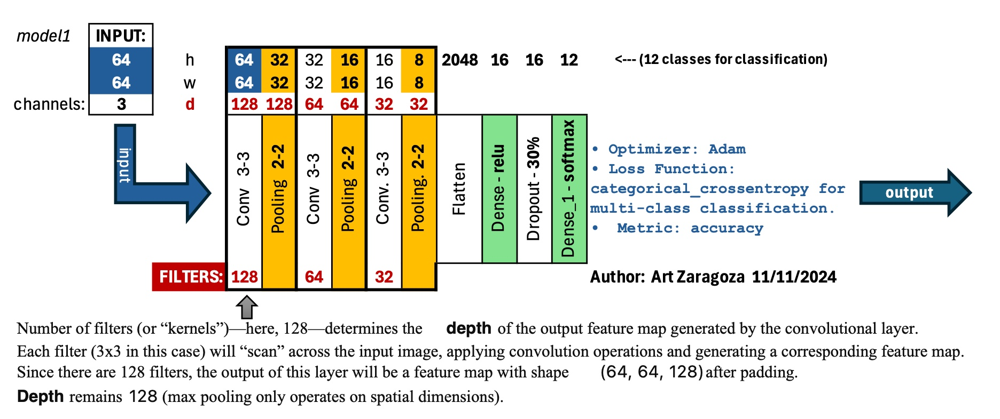

https://alexlenail.me/NN-SVG/LeNet.html
NN-SVG MODEL (GRAPHIC).  <<<<------- Online Drawing Tool Used for building the following Architecture Schematic:

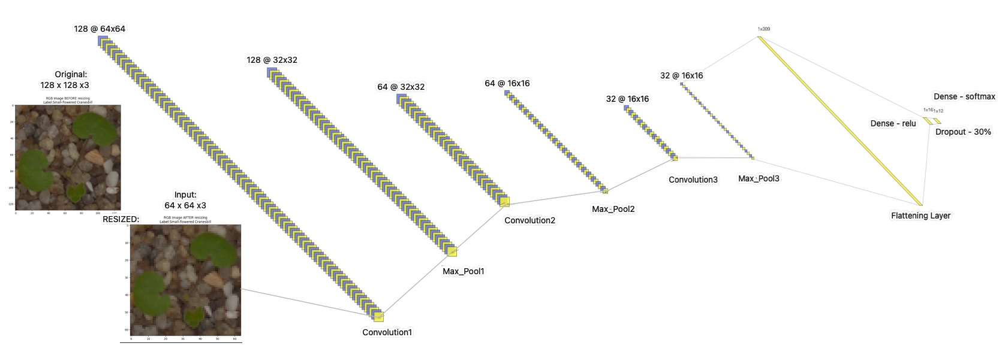

<b> Fitting the model on the train data

In [ ]:
# Fit the model on the training data
history_1 = model1.fit(
    X_train_normalized,  # Input data for training
    y_train_encoded,     # Corresponding labels for training
    epochs=30,           # Number of epochs for training
    validation_data=(X_val_normalized, y_val_encoded),  # Validation data
    batch_size=32,       # Batch size for training
    verbose=2            # Verbosity mode
)

Epoch 1/30
119/119 - 16s - 138ms/step - accuracy: 0.1342 - loss: 2.4462 - val_accuracy: 0.2358 - val_loss: 2.3607
Epoch 2/30
119/119 - 1s - 9ms/step - accuracy: 0.2042 - loss: 2.2834 - val_accuracy: 0.2737 - val_loss: 2.0487
Epoch 3/30
119/119 - 1s - 9ms/step - accuracy: 0.2597 - loss: 2.0837 - val_accuracy: 0.3137 - val_loss: 1.9253
Epoch 4/30
119/119 - 1s - 9ms/step - accuracy: 0.2792 - loss: 1.9790 - val_accuracy: 0.3453 - val_loss: 1.8321
Epoch 5/30
119/119 - 1s - 9ms/step - accuracy: 0.3068 - loss: 1.9156 - val_accuracy: 0.3874 - val_loss: 1.7766
Epoch 6/30
119/119 - 1s - 9ms/step - accuracy: 0.3263 - loss: 1.8654 - val_accuracy: 0.4000 - val_loss: 1.6814
Epoch 7/30
119/119 - 1s - 9ms/step - accuracy: 0.3292 - loss: 1.8248 - val_accuracy: 0.4253 - val_loss: 1.6298
Epoch 8/30
119/119 - 1s - 9ms/step - accuracy: 0.3353 - loss: 1.7964 - val_accuracy: 0.4316 - val_loss: 1.5866
Epoch 9/30
119/119 - 1s - 9ms/step - accuracy: 0.3379 - loss: 1.7784 - val_accuracy: 0.4526 - val_loss: 1.603

**Model Evaluation**

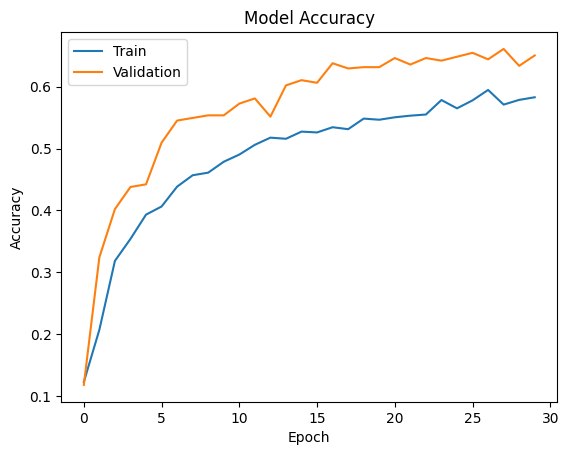

In [ ]:
plt.plot(history_1.history['accuracy'])
plt.plot(history_1.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

Observations:
- Notice the model is <font color=red>**Underfitting** </font>with the training and will benefit from adjustments and some fine-tuning.
- Consider the following:
 -   	Increase Model Complexity: Try a more complex model or add more features.
 -    Reduce Regularization: If applicable, reduce regularization to allow the model to fit the training data better.
 -    Train Longer: Allow more training epochs, especially if the model is still learning.
 -    Clean Data: Ensure the training data quality is high and labels are correct.


Same Model, more Epochs and larger Batch size:
- The batch_size parameter specifies the number of samples processed before the model’s weights are updated. Here, batch_size=64 means the model will process 64 samples as opposed to 32 samples at a time and then update the weights, which can improve training efficiency and convergence stability.

In [ ]:
# Fit the model on the training data
history_2 = model1.fit(
    X_train_normalized,  # Input data for training
    y_train_encoded,     # Corresponding labels for training
    epochs=50,           # Number of epochs for training
    validation_data=(X_val_normalized, y_val_encoded),  # Validation data
    batch_size=64,       # Batch size for training
    verbose=2            # Verbosity mode
)

Epoch 1/50
60/60 - 1s - 18ms/step - accuracy: 0.8216 - loss: 0.4789 - val_accuracy: 0.7074 - val_loss: 3.3411
Epoch 2/50
60/60 - 1s - 17ms/step - accuracy: 0.8213 - loss: 0.4628 - val_accuracy: 0.6842 - val_loss: 3.7541
Epoch 3/50
60/60 - 1s - 17ms/step - accuracy: 0.8324 - loss: 0.4350 - val_accuracy: 0.6758 - val_loss: 3.6137
Epoch 4/50
60/60 - 1s - 17ms/step - accuracy: 0.8218 - loss: 0.4846 - val_accuracy: 0.7032 - val_loss: 3.4823
Epoch 5/50
60/60 - 1s - 17ms/step - accuracy: 0.8276 - loss: 0.4537 - val_accuracy: 0.6863 - val_loss: 3.6213
Epoch 6/50
60/60 - 1s - 17ms/step - accuracy: 0.8318 - loss: 0.4448 - val_accuracy: 0.7032 - val_loss: 3.3892
Epoch 7/50
60/60 - 1s - 17ms/step - accuracy: 0.8303 - loss: 0.4548 - val_accuracy: 0.6884 - val_loss: 3.5873
Epoch 8/50
60/60 - 1s - 17ms/step - accuracy: 0.8237 - loss: 0.4681 - val_accuracy: 0.6968 - val_loss: 3.4013
Epoch 9/50
60/60 - 1s - 18ms/step - accuracy: 0.8234 - loss: 0.4851 - val_accuracy: 0.6989 - val_loss: 3.3771
Epoch 10/5

**Model Evaluation after adjusting Epochs and Batch Size**

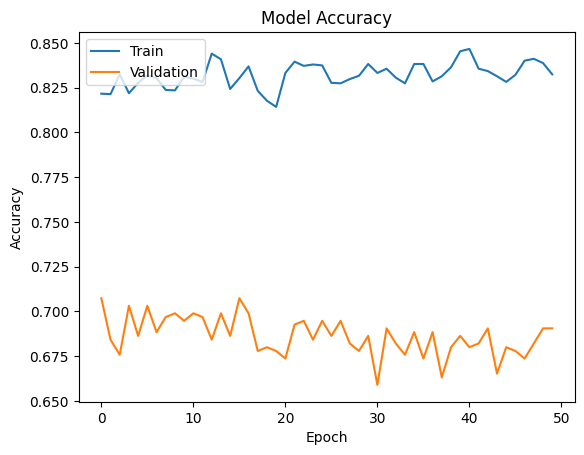

In [ ]:
import matplotlib.pyplot as plt

plt.plot(history_2.history['accuracy'])
plt.plot(history_2.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

Observations:
- The Training accuracy increased with more Epochs and Batch sized.
- However, the Validation accuracy shows now an <font color=red> **Overfitting** </font> scenario.
- This model offers a higher performance with the training as compared to the first model. (But the Overfitting is worrysome)

**Evaluate the model on test data**

In [ ]:
# Evaluate the model on test data
loss, accuracy = model1.evaluate(X_test_normalized, y_test_encoded, verbose=0)
print(f"Test Loss: {loss:.4f}")
print(f"Test Accuracy: {accuracy:.4f}")

Test Loss: 4.1427
Test Accuracy: 0.7053


Observations:
-  Both the Test and the Validation accuracy were in the same range.

**Plotting the Confusion Matrix**

15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


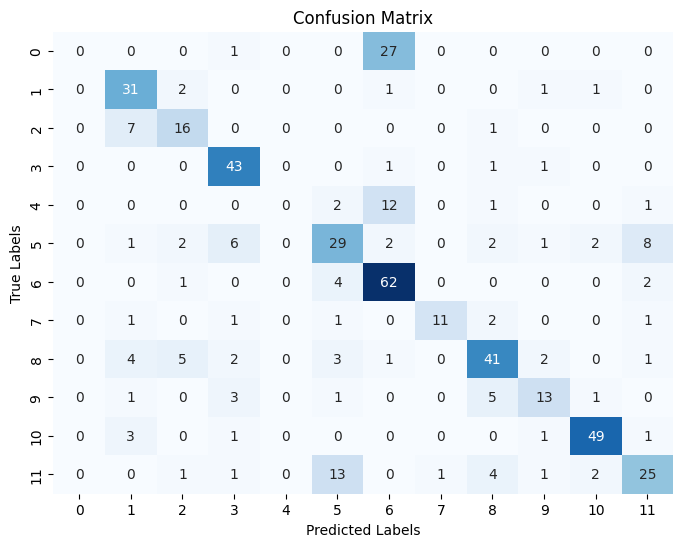


 All Performance Metrics done on TEST dataset:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00        28
           1       0.65      0.86      0.74        36
           2       0.59      0.67      0.63        24
           3       0.74      0.93      0.83        46
           4       0.00      0.00      0.00        16
           5       0.55      0.55      0.55        53
           6       0.58      0.90      0.71        69
           7       0.92      0.65      0.76        17
           8       0.72      0.69      0.71        59
           9       0.65      0.54      0.59        24
          10       0.89      0.89      0.89        55
          11       0.64      0.52      0.57        48

    accuracy                           0.67       475
   macro avg       0.58      0.60      0.58       475
weighted avg       0.62      0.67      0.64       475



In [ ]:
# Confusion Matrix and all performance metrics on test dataset

import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import confusion_matrix, classification_report

# Predict on the test data
predictions = model1.predict(X_test_normalized)
predicted_labels = np.argmax(predictions, axis=1)
true_labels = np.argmax(y_test_encoded, axis=1)


# Confusion Matrix
cm = confusion_matrix(true_labels, predicted_labels)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix")
plt.show()


# Performance Metrics
print("\n All Performance Metrics done on TEST dataset:\n")
print(classification_report(true_labels, predicted_labels))

In [ ]:
# Predict the output probabilities for each category
y_pred = model1.predict(X_test_normalized)

15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


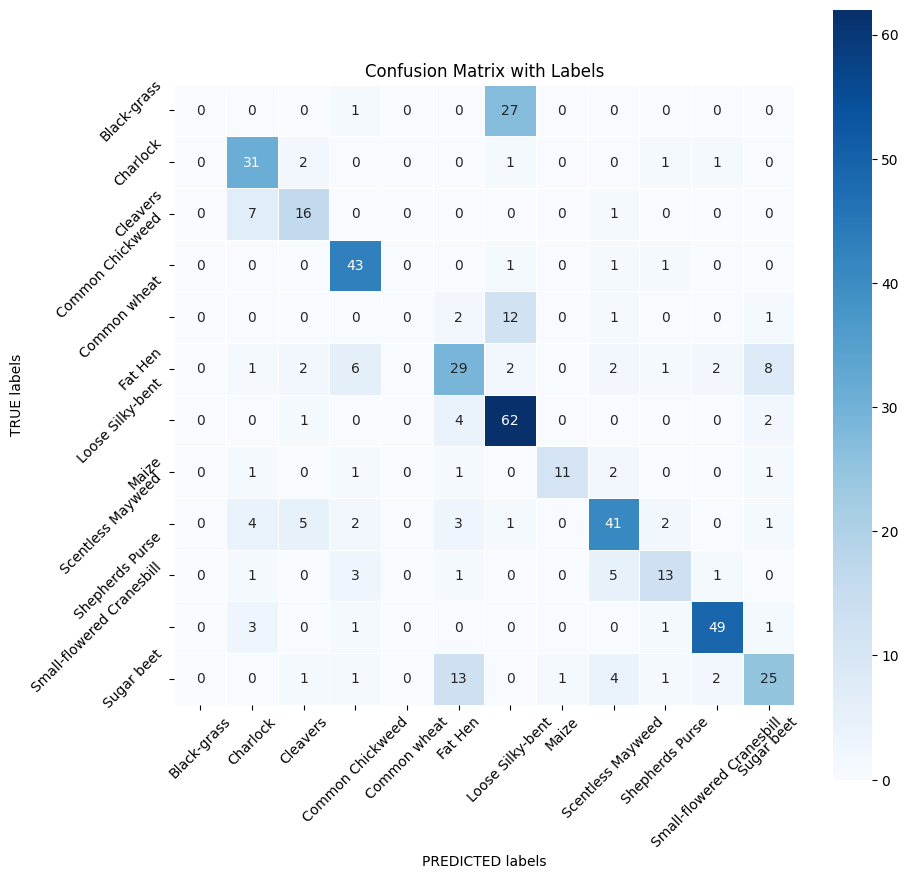

In [ ]:
# Obtaining the categorical values from y_test_encoded and y_pred
y_pred_arg=np.argmax(y_pred,axis=1)
y_test_arg=np.argmax(y_test_encoded,axis=1)
# Plotting the Confusion Matrix using confusion matrix() function which is also predefined in tensorflow module
confusion_matrix = tf.math.confusion_matrix(y_test_arg,y_pred_arg)              # Complete the code to plot the confusion matrix
f, ax = plt.subplots(figsize=(10,10))
sns.heatmap(
    confusion_matrix,
    annot=True,
    linewidths=.4,
    fmt="d",
    square=True,
    ax=ax,
    cmap="Blues"
)
# Setting the labels to both the axes
ax.set_xlabel('PREDICTED labels');ax.set_ylabel('TRUE labels');
ax.set_title('Confusion Matrix with Labels');
ax.xaxis.set_ticklabels(list(enc.classes_),rotation=45)
ax.yaxis.set_ticklabels(list(enc.classes_),rotation=45)
plt.show()

**Printing a Classification Report**

In [ ]:
cr = metrics.classification_report(true_labels, predicted_labels)     # Print the classification report
print(cr)

              precision    recall  f1-score   support

           0       0.00      0.00      0.00        28
           1       0.65      0.86      0.74        36
           2       0.59      0.67      0.63        24
           3       0.74      0.93      0.83        46
           4       0.00      0.00      0.00        16
           5       0.55      0.55      0.55        53
           6       0.58      0.90      0.71        69
           7       0.92      0.65      0.76        17
           8       0.72      0.69      0.71        59
           9       0.65      0.54      0.59        24
          10       0.89      0.89      0.89        55
          11       0.64      0.52      0.57        48

    accuracy                           0.67       475
   macro avg       0.58      0.60      0.58       475
weighted avg       0.62      0.67      0.64       475



## Model Performance Improvement

**Reducing the Learning Rate:**

-  **ReduceLRonPlateau()** is a function that will be used to decrease the learning rate by some factor, if the loss is not decreasing for some time. This may start decreasing the loss at a smaller learning rate. There is a possibility that the loss may still not decrease. This may lead to executing the learning rate reduction again in an attempt to achieve a lower loss.

In [ ]:
# Code to monitor val_accuracy
learning_rate_reduction = ReduceLROnPlateau(monitor='val_accuracy',
                                            patience=3,
                                            verbose=1,
                                            factor=0.5,
                                            min_lr=0.00001)


### **Data Augmentation**

In [ ]:
# Clearing backend
from tensorflow.keras import backend
backend.clear_session()

# Fixing the seed for random number generators
import random
np.random.seed(42)
random.seed(42)
tf.random.set_seed(42)

On the Training set, we can experiment with Data Augmentation by including:
- Image Rotation
- Brightness ? Darkness change
- Image Flipping

In [ ]:
# Set the rotation_range to 20
train_datagen = ImageDataGenerator(
                              rotation_range=20,
                              fill_mode='nearest'
                              )

## 2nd Model with Data Augmentation and Batch Normalization

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam

# Initializing our sequential model
model2 = Sequential()

# Adding the first convolutional layer with 64 filters and kernel size 3x3
model2.add(Conv2D(64, (3, 3), activation='relu', padding="same", input_shape=(64, 64, 3)))

# Adding max pooling to reduce the size of output of the first conv layer
model2.add(MaxPooling2D((2, 2), padding='same'))

# Adding more convolutional layers
model2.add(Conv2D(32, (3, 3), activation='relu', padding="same"))
model2.add(MaxPooling2D((2, 2), padding='same'))
model2.add(BatchNormalization())

# Flattening the output of the conv layer after max pooling
model2.add(Flatten())

# Adding a fully connected dense layer with 16 neurons
model2.add(Dense(16, activation='relu'))

# Adding dropout with dropout_rate=0.3
model2.add(Dropout(0.3))

# Adding the output layer with 12 neurons and softmax activation function
model2.add(Dense(12, activation='softmax'))

# Initializing Adam Optimizer
opt = Adam()

# Compiling the model
model2.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['accuracy'])

# Generating the summary of the model
model2.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_5 (Conv2D)                    │ (None, 64, 64, 64)          │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_5 (MaxPooling2D)       │ (None, 32, 32, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_6 (Conv2D)                    │ (None, 32, 32, 32)          │          18,464 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_6 (MaxPooling2D)       │ (None, 16, 16, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 16, 16, 32)          │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_2 (Flatten)                  │ (None, 8192)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 16)                  │         131,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 16)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 151,676 (592.48 KB)

 Trainable params: 151,612 (592.23 KB)

 Non-trainable params: 64 (256.00 B)

3rd Model with More Convolution Layers

In [ ]:
# Initializing our sequential model
model3 = Sequential()

# Adding the first convolutional layer with 64 filters and kernel size 3x3
model3.add(Conv2D(64, (3, 3), activation='relu', padding="same", input_shape=(64, 64, 3)))

# Adding max pooling to reduce the size of output of the first conv layer
model3.add(MaxPooling2D((2, 2), padding='same'))

# Adding more convolutional layers
model3.add(Conv2D(32, (3, 3), activation='relu', padding="same"))
model3.add(MaxPooling2D((2, 2), padding='same'))
model3.add(BatchNormalization())

# Adding more convolutional layers
model3.add(Conv2D(32, (3, 3), activation='relu', padding="same"))
model3.add(MaxPooling2D((2, 2), padding='same'))
model3.add(BatchNormalization())

# Flattening the output of the conv layer after max pooling
model3.add(Flatten())

# Adding a fully connected dense layer with 16 neurons
model3.add(Dense(16, activation='relu'))

# Adding dropout with dropout_rate=0.3
model3.add(Dropout(0.3))

# Adding the output layer with 12 neurons and softmax activation function
model3.add(Dense(12, activation='softmax'))

# Initializing Adam Optimizer
opt = Adam()

# Compiling the model
model3.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['accuracy'])

# Generating the summary of the model
model3.summary()

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_7 (Conv2D)                    │ (None, 64, 64, 64)          │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_7 (MaxPooling2D)       │ (None, 32, 32, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_8 (Conv2D)                    │ (None, 32, 32, 32)          │          18,464 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_8 (MaxPooling2D)       │ (None, 16, 16, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 16, 16, 32)          │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_9 (Conv2D)                    │ (None, 16, 16, 32)          │           9,248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_9 (MaxPooling2D)       │ (None, 8, 8, 32)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_5                │ (None, 8, 8, 32)            │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_3 (Flatten)                  │ (None, 2048)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6 (Dense)                      │ (None, 16)                  │          32,784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 16)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7 (Dense)                      │ (None, 12)                  │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 62,748 (245.11 KB)

 Trainable params: 62,620 (244.61 KB)

 Non-trainable params: 128 (512.00 B)



---



**IMPORTANT**:

When fitting a model in Keras, it’s important to ensure that we use the preprocessed data that has been normalized. In our case, you should fit the model on <font color=violet> **the normalized training data** </font>rather than the raw training data. This helps the model learn better and speeds up convergence.

Here’s how to adjust our fitting code accordingly:

Fitting the Model on Normalized Training Data

***Make sure we are using the normalized training data (X_train_normalized) and the corresponding one-hot encoded labels (y_train_encoded) when calling the fit method***

-  X_train_normalized: This is the training data with pixel values normalized to the range of 0-1, which is crucial for the model’s performance.
-  y_train_encoded: The one-hot encoded labels corresponding to the training data.
-  train_datagen.flow: This is used for data augmentation and to create batches of training data.
-  validation_data: We should also use the normalized validation data (X_val_normalized) and the encoded validation labels (y_val_encoded).

Summary:

Always ensure both the training and validation datasets <font color=red>**are normalized before** </font>fitting your model, as this significantly impacts the learning process and the final performance of the model.



---



<b> Fitting the model on the train data

In [ ]:
# Fit the model on train data with batch_size=64 and epochs=30
# Epochs
epochs = 60
# Batch size
batch_size = 64

history = model2.fit(train_datagen.flow(X_train_normalized,y_train_encoded,
                                       batch_size=batch_size,
                                       shuffle=False),
                                       epochs=epochs,
                                       steps_per_epoch=X_train_normalized.shape[0] // batch_size,
                                       validation_data=(X_val_normalized,y_val_encoded),
                                       verbose=1,callbacks=[learning_rate_reduction])

Epoch 1/60
59/59 ━━━━━━━━━━━━━━━━━━━━ 13s 161ms/step - accuracy: 0.1585 - loss: 2.3498 - val_accuracy: 0.2316 - val_loss: 2.4075 - learning_rate: 0.0010
Epoch 2/60
59/59 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1719 - loss: 2.2942 - val_accuracy: 0.2232 - val_loss: 2.4123 - learning_rate: 0.0010
Epoch 3/60
59/59 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step - accuracy: 0.3761 - loss: 1.8418 - val_accuracy: 0.3726 - val_loss: 2.3532 - learning_rate: 0.0010
Epoch 4/60
59/59 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4375 - loss: 1.5496 - val_accuracy: 0.3642 - val_loss: 2.3388 - learning_rate: 0.0010
Epoch 5/60
59/59 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step - accuracy: 0.4506 - loss: 1.6077 - val_accuracy: 0.3916 - val_loss: 2.2024 - learning_rate: 0.0010
Epoch 6/60
59/59 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3750 - loss: 1.5535 - val_accuracy: 0.3853 - val_loss: 2.2103 - learning_rate: 0.0010
Epoch 7/60
59/59 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - accuracy: 0.4860 - loss: 1.4797 - val_accu

**Normalized Model:  Evaluations**

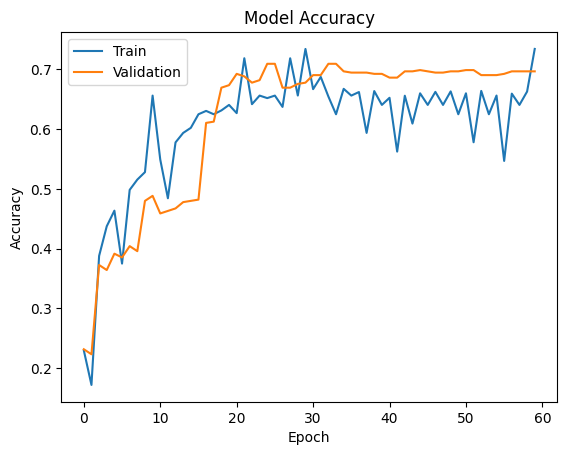

In [ ]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

Observations:

<Font color=violet>Model #2 with both **Normalized** and **Data Augmentation** was less Overfitting indicating an improvement! Yay!!!</font>

**Now we Evaluate the model on test data...drumroll**

In [ ]:
accuracy = model2.evaluate(X_test_normalized, y_test_encoded, verbose=2)  # Evaluate the model on test data

15/15 - 0s - 4ms/step - accuracy: 0.7116 - loss: 0.8976


Observation:
- Both the Test Data and Validation data were in the same range for accuracy.
- The <font color=violet>"**unseen**"</font> data from the test data was well predicted with nearly 70% accuracy.

**Plotting the Confusion Matrix**

In [ ]:
# Output probabilities
y_pred=model2.predict(X_test_normalized)

15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step


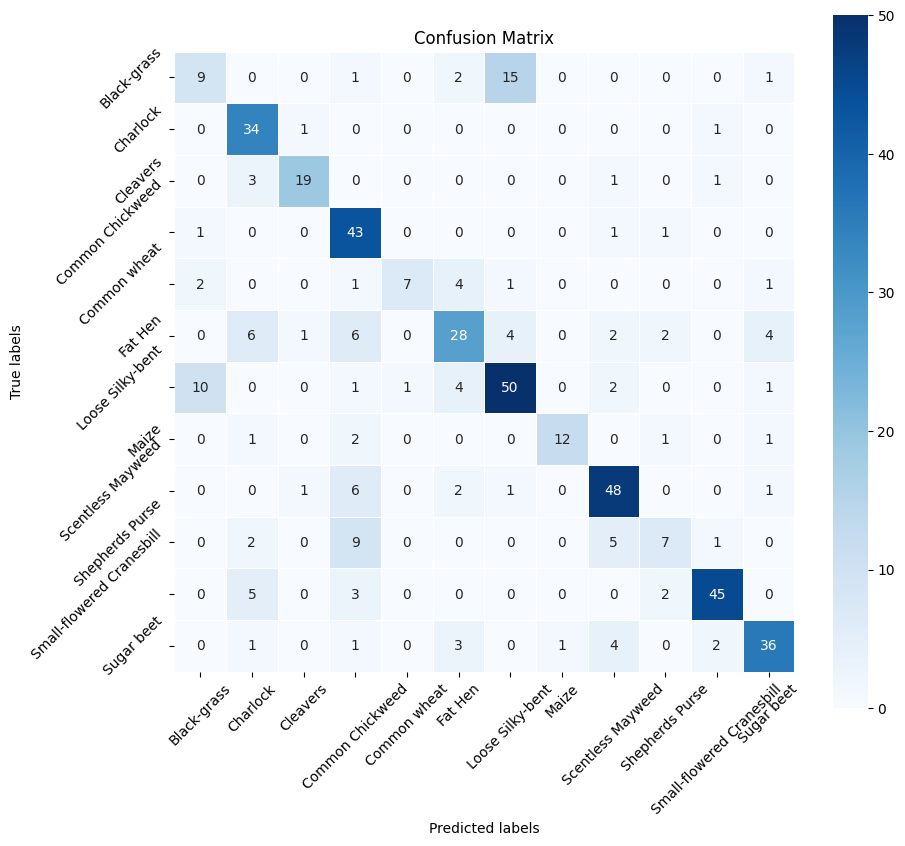

In [ ]:
# Obtaining the categorical values from y_test_encoded and y_pred
y_pred_arg=np.argmax(y_pred,axis=1)
y_test_arg=np.argmax(y_test_encoded,axis=1)

# Confusion matrix() function which is also predefined in tensorflow module
confusion_matrix = tf.math.confusion_matrix(y_test_arg,y_pred_arg)     # Confusion matrix
f, ax = plt.subplots(figsize=(10, 9))
sns.heatmap(
    confusion_matrix,
    annot=True,
    linewidths=.4,
    fmt="d",
    square=True,
    ax=ax,
    cmap="Blues"
)
# Setting the labels to both the axes
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels');
ax.set_title('Confusion Matrix');
ax.xaxis.set_ticklabels(list(enc.classes_),rotation=45)
ax.yaxis.set_ticklabels(list(enc.classes_),rotation=45)
plt.show()

**Plotting Classification Report**

In [ ]:
# Display the classification report

from sklearn.metrics import classification_report

# Predict on the test data
predictions = model2.predict(X_test_normalized)
predicted_labels = np.argmax(predictions, axis=1)
true_labels = np.argmax(y_test_encoded, axis=1)

# Performance Metrics
print("\n All Performance Metrics done on TEST dataset:\n")
print(classification_report(true_labels, predicted_labels))

15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 

 All Performance Metrics done on TEST dataset:

              precision    recall  f1-score   support

           0       0.41      0.32      0.36        28
           1       0.65      0.94      0.77        36
           2       0.86      0.79      0.83        24
           3       0.59      0.93      0.72        46
           4       0.88      0.44      0.58        16
           5       0.65      0.53      0.58        53
           6       0.70      0.72      0.71        69
           7       0.92      0.71      0.80        17
           8       0.76      0.81      0.79        59
           9       0.54      0.29      0.38        24
          10       0.90      0.82      0.86        55
          11       0.80      0.75      0.77        48

    accuracy                           0.71       475
   macro avg       0.72      0.67      0.68       475
weighted avg       0.72      0.71      0.70       475



## A 4th Model to Consider

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, BatchNormalization, Flatten, Dense, Dropout
from tensorflow.keras.optimizers import Adam

# Initializing a sequential model
model3 = Sequential()

# Adding the first convolutional layer with 128 filters and kernel size 3x3
model3.add(Conv2D(128, (3, 3), activation='relu', padding="same", input_shape=(64, 64, 3)))
model3.add(BatchNormalization())
model3.add(MaxPooling2D((2, 2), padding='same'))

# Adding more convolutional layers
model3.add(Conv2D(64, (3, 3), activation='relu', padding="same"))
model3.add(BatchNormalization())
model3.add(MaxPooling2D((2, 2), padding='same'))

model3.add(Conv2D(64, (3, 3), activation='relu', padding="same"))
model3.add(BatchNormalization())
model3.add(MaxPooling2D((2, 2), padding='same'))

model3.add(Conv2D(32, (3, 3), activation='relu', padding="same"))
model3.add(BatchNormalization())
model3.add(MaxPooling2D((2, 2), padding='same'))

# Flattening the output of the conv layer after max pooling
model3.add(Flatten())

# Adding a fully connected dense layer with 64 neurons
model3.add(Dense(64, activation='relu'))
model3.add(Dropout(0.5))

# Adding another fully connected dense layer with 32 neurons
model3.add(Dense(32, activation='relu'))
model3.add(Dropout(0.3))

# Adding the output layer with 12 neurons and softmax activation function
model3.add(Dense(12, activation='softmax'))

# Initializing Adam Optimizer
opt = Adam()

# Compiling the model
model3.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['accuracy'])

# Generating the summary of the model
model3.summary()

Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_10 (Conv2D)                   │ (None, 64, 64, 128)         │           3,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_6                │ (None, 64, 64, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_10 (MaxPooling2D)      │ (None, 32, 32, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_11 (Conv2D)                   │ (None, 32, 32, 64)          │          73,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_7                │ (None, 32, 32, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_11 (MaxPooling2D)      │ (None, 16, 16, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_12 (Conv2D)                   │ (None, 16, 16, 64)          │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_8                │ (None, 16, 16, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_12 (MaxPooling2D)      │ (None, 8, 8, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_13 (Conv2D)                   │ (None, 8, 8, 32)            │          18,464 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_9                │ (None, 8, 8, 32)            │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_13 (MaxPooling2D)      │ (None, 4, 4, 32)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_4 (Flatten)                  │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_8 (Dense)                      │ (None, 64)                  │          32,832 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_4 (Dropout)                  │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_9 (Dense)                      │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_5 (Dropout)                  │ (None, 32)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_10 (Dense)                     │ (None, 12)                  │             396 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 169,228 (661.05 KB)

 Trainable params: 168,652 (658.80 KB)

 Non-trainable params: 576 (2.25 KB)

Fitting the 3d Model on the Training Dataset
- Increasing the number of Epochs.


In [ ]:
# Fit the model on train data with batch_size=64 and epochs GREATER than 30
# Epochs
epochs = 50
# Batch size
batch_size = 64

history_3 = model3.fit(train_datagen.flow(X_train_normalized,y_train_encoded,
                                       batch_size=batch_size,
                                       shuffle=False),
                                       epochs=epochs,
                                       steps_per_epoch=X_train_normalized.shape[0] // batch_size,
                                       validation_data=(X_val_normalized,y_val_encoded),
                                       verbose=1,callbacks=[learning_rate_reduction])

Epoch 1/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - accuracy: 0.6205 - loss: 1.1449 - val_accuracy: 0.7495 - val_loss: 0.8930 - learning_rate: 1.0000e-05
Epoch 2/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5469 - loss: 1.4556 - val_accuracy: 0.7495 - val_loss: 0.8929 - learning_rate: 1.0000e-05
Epoch 3/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - accuracy: 0.6202 - loss: 1.1164 - val_accuracy: 0.7453 - val_loss: 0.8921 - learning_rate: 1.0000e-05
Epoch 4/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6250 - loss: 1.2441 - val_accuracy: 0.7453 - val_loss: 0.8921 - learning_rate: 1.0000e-05
Epoch 5/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - accuracy: 0.6050 - loss: 1.1281 - val_accuracy: 0.7474 - val_loss: 0.8880 - learning_rate: 1.0000e-05
Epoch 6/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5156 - loss: 1.2399 - val_accuracy: 0.7474 - val_loss: 0.8879 - learning_rate: 1.0000e-05
Epoch 7/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - accuracy: 0.6213 - l

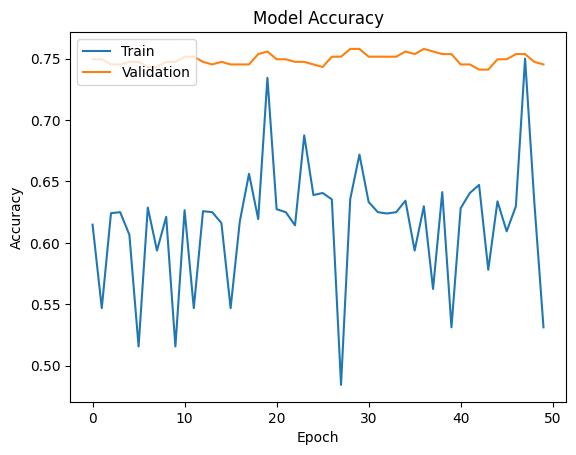

In [ ]:
plt.plot(history_3.history['accuracy'])
plt.plot(history_3.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

Observations:
- Model3 exhibit Underfitting Behavior now....but the increase in the number of Epochs made the difference on the Validation set.

In [ ]:
accuracy = model3.evaluate(X_test_normalized, y_test_encoded, verbose=2)  # Evaluate the model on test data

15/15 - 0s - 5ms/step - accuracy: 0.7158 - loss: 0.8613


In [ ]:
# Output probabilities
y_pred=model3.predict(X_test_normalized)

15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


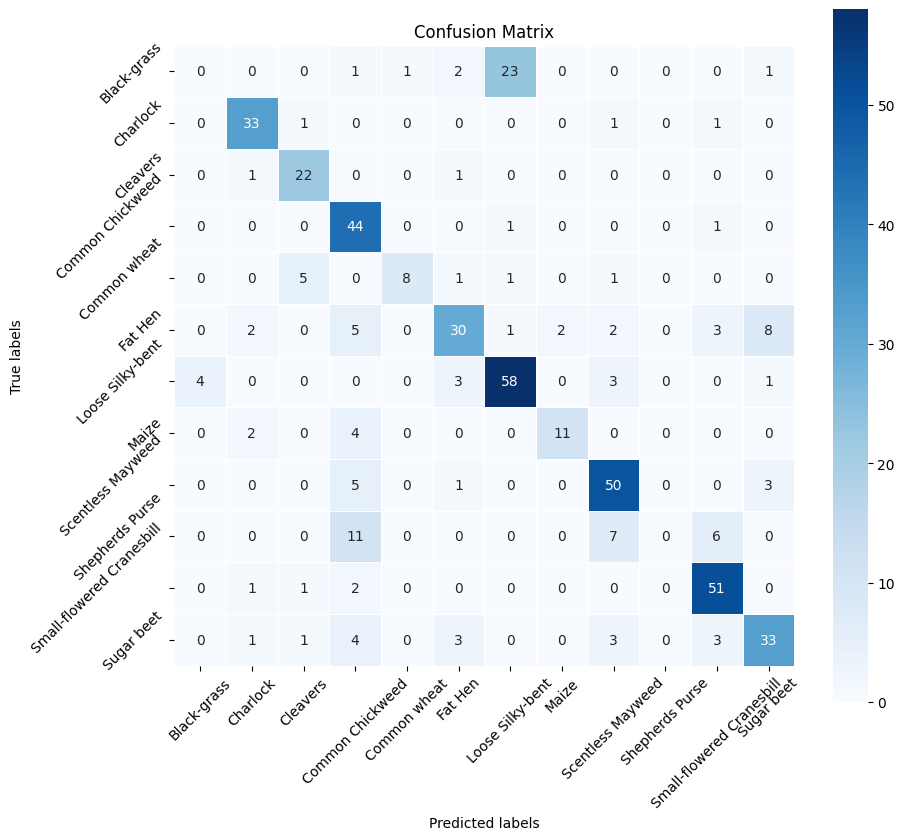

In [ ]:
# Obtaining the categorical values from y_test_encoded and y_pred
y_pred_arg=np.argmax(y_pred,axis=1)
y_test_arg=np.argmax(y_test_encoded,axis=1)

# Confusion matrix() function which is also predefined in tensorflow module
confusion_matrix = tf.math.confusion_matrix(y_test_arg,y_pred_arg)     # Confusion matrix
f, ax = plt.subplots(figsize=(10, 9))
sns.heatmap(
    confusion_matrix,
    annot=True,
    linewidths=.4,
    fmt="d",
    square=True,
    ax=ax,
    cmap="Blues"
)
# Setting the labels to both the axes
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels');
ax.set_title('Confusion Matrix');
ax.xaxis.set_ticklabels(list(enc.classes_),rotation=45)
ax.yaxis.set_ticklabels(list(enc.classes_),rotation=45)
plt.show()

In [ ]:
# Display the classification report

from sklearn.metrics import classification_report

# Predict on the test data
predictions = model3.predict(X_test_normalized)
predicted_labels = np.argmax(predictions, axis=1)
true_labels = np.argmax(y_test_encoded, axis=1)

# Performance Metrics
print("\n All Performance Metrics done on TEST dataset:\n")
print(classification_report(true_labels, predicted_labels))

15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 

 All Performance Metrics done on TEST dataset:

              precision    recall  f1-score   support

           0       0.00      0.00      0.00        28
           1       0.82      0.92      0.87        36
           2       0.73      0.92      0.81        24
           3       0.58      0.96      0.72        46
           4       0.89      0.50      0.64        16
           5       0.73      0.57      0.64        53
           6       0.69      0.84      0.76        69
           7       0.85      0.65      0.73        17
           8       0.75      0.85      0.79        59
           9       0.00      0.00      0.00        24
          10       0.78      0.93      0.85        55
          11       0.72      0.69      0.70        48

    accuracy                           0.72       475
   macro avg       0.63      0.65      0.63       475
weighted avg       0.65      0.72      0.67       475





---



VGG16 Model

In [ ]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras.layers import Flatten, Dense, Dropout, Input
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Model

# Define the input shape
input_tensor = Input(shape=(64, 64, 3))

# Load the VGG16 model without the top layers, using the functional API
vgg16_base = VGG16(weights='imagenet', include_top=False, input_tensor=input_tensor)

# Freeze the VGG16 base layers
for layer in vgg16_base.layers:
    layer.trainable = False

# Add custom layers on top of the VGG16 base model
x = Flatten()(vgg16_base.output)
x = Dense(2048, activation='relu')(x)
x = Dropout(0.5)(x)
x = Dense(2048, activation='relu')(x)
x = Dropout(0.5)(x)
output = Dense(12, activation='softmax')(x)  # Output layer for 12 classes

# Define the complete model
model_vgg16 = Model(inputs=input_tensor, outputs=output)

# Compile the model
opt = Adam()
model_vgg16.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['accuracy'])

# Display the model summary
model_vgg16.summary()

Model: "functional_60"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_8 (InputLayer)           │ (None, 64, 64, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, 64, 64, 64)          │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv2 (Conv2D)                │ (None, 64, 64, 64)          │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_pool (MaxPooling2D)           │ (None, 32, 32, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv1 (Conv2D)                │ (None, 32, 32, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv2 (Conv2D)                │ (None, 32, 32, 128)         │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_pool (MaxPooling2D)           │ (None, 16, 16, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv1 (Conv2D)                │ (None, 16, 16, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv2 (Conv2D)                │ (None, 16, 16, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv3 (Conv2D)                │ (None, 16, 16, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_pool (MaxPooling2D)           │ (None, 8, 8, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv1 (Conv2D)                │ (None, 8, 8, 512)           │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv2 (Conv2D)                │ (None, 8, 8, 512)           │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv3 (Conv2D)                │ (None, 8, 8, 512)           │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_pool (MaxPooling2D)           │ (None, 4, 4, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv1 (Conv2D)                │ (None, 4, 4, 512)           │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv2 (Conv2D)                │ (None, 4, 4, 512)           │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv3 (Conv2D)                │ (None, 4, 4, 512)           │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_pool (MaxPooling2D)           │ (None, 2, 2, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_8 (Flatten)                  │ (None, 2048)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_20 (Dense)                     │ (None, 2048)                │       4,196,352 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 23,131,980 (88.24 MB)

 Trainable params: 8,417,292 (32.11 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

Explanation of Key Components with the VGG16 model:

-  1.	VGG16 Base Model: We load the VGG16 model pre-trained on ImageNet, excluding the top classification layer (include_top=False). This version will work as a feature extractor.
-  2.	Freezing Layers: Freezing the VGG16 layers keeps the learned ImageNet weights intact, which is useful if the dataset size is small.
-  3.	Custom Fully Connected Layers: We add a fully connected layer with BatchNormalization and Dropout for regularization, followed by a 12-neuron output layer with softmax for multiclass classification.
-  4.	Compilation: The model is compiled with the Adam optimizer and categorical cross-entropy loss.

This code fine-tunes only the added layers, making it efficient while benefiting from VGG16’s pre-trained features.

In [ ]:
# Parameters for training
epochs = 50
batch_size = 64

# Fit the model using the specified parameters
history_vgg16 = model_vgg16.fit(
    train_datagen.flow(X_train_normalized, y_train_encoded, batch_size=batch_size, shuffle=False),
    epochs=epochs,
    steps_per_epoch=X_train_normalized.shape[0] // batch_size,
    validation_data=(X_val_normalized, y_val_encoded),
    verbose=1,
    callbacks=[learning_rate_reduction]
)

Epoch 1/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 19s 205ms/step - accuracy: 0.1961 - loss: 2.5828 - val_accuracy: 0.4021 - val_loss: 1.7457 - learning_rate: 0.0010
Epoch 2/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.3438 - loss: 1.6298 - val_accuracy: 0.4021 - val_loss: 1.7329 - learning_rate: 0.0010
Epoch 3/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - accuracy: 0.3957 - loss: 1.6730 - val_accuracy: 0.4632 - val_loss: 1.5070 - learning_rate: 0.0010
Epoch 4/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.3750 - loss: 1.7015 - val_accuracy: 0.4653 - val_loss: 1.5077 - learning_rate: 0.0010
Epoch 5/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - accuracy: 0.4673 - loss: 1.4903 - val_accuracy: 0.4989 - val_loss: 1.4321 - learning_rate: 0.0010
Epoch 6/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5000 - loss: 1.3659 - val_accuracy: 0.4884 - val_loss: 1.4406 - learning_rate: 0.0010
Epoch 7/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - accuracy: 0.4708 - loss: 1.4298 - val_accu

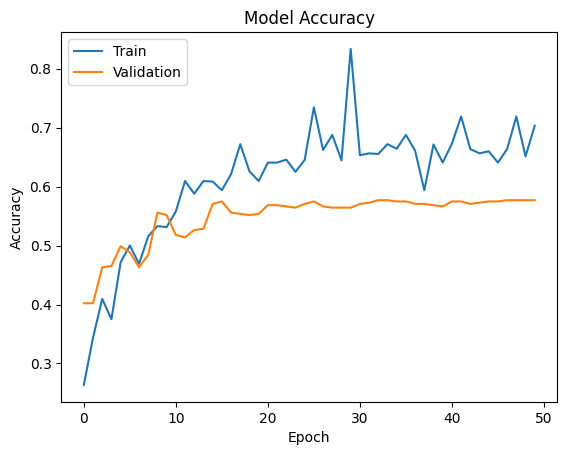

In [ ]:
plt.plot(history_vgg16.history['accuracy'])
plt.plot(history_vgg16.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

Observations:
- Overfitting after the 10th Epoch with the Validation accuracy averaging around 55%.
- However, the Validation set became more uniform after only the 15 Epoch (**less processing GPU time with this model**).


---



## Use the Final Model

Comments on the final model we selected so far and use the same in the below code to visualize the images.

In [ ]:
print("Evaluate model1 on test data:")
loss, accuracy = model1.evaluate(X_test_normalized, y_test_encoded, verbose=0)
print(f"Test Loss: {loss:.4f}")
print(f"Test Accuracy: {accuracy:.4f}")
print("\nEvaluate model2 on test data:")
loss, accuracy = model2.evaluate(X_test_normalized, y_test_encoded, verbose=0)
print(f"Test Loss: {loss:.4f}")
print(f"Test Accuracy: {accuracy:.4f}")
print("\nEvaluate model3 on test data:")
loss, accuracy = model3.evaluate(X_test_normalized, y_test_encoded, verbose=0)
print(f"Test Loss: {loss:.4f}")
print(f"Test Accuracy: {accuracy:.4f}")
print("\nEvaluate model_vgg16 on test data:")
loss, accuracy = model_vgg16.evaluate(X_test_normalized, y_test_encoded, verbose=0)
print(f"Test Loss: {loss:.4f}")
print(f"Test Accuracy: {accuracy:.4f}")

Evaluate model1 on test data:
Test Loss: 4.1427
Test Accuracy: 0.7053

Evaluate model2 on test data:
Test Loss: 0.8976
Test Accuracy: 0.7116

Evaluate model3 on test data:
Test Loss: 0.8613
Test Accuracy: 0.7158

Evaluate model_vgg16 on test data:
Test Loss: 1.1478
Test Accuracy: 0.6316


**GOAL: Lower Test Loss whilst Higher Test Accuracy**

SUMMARY:<table border="1" cellpadding="12">
  <tr>
    <th>Model</th>
    <th>Test Loss</th>
    <th>Test Accuracy</th>
    <th>Observations</th>
  </tr>
  <tr>
    <td>Model1</td>
    <td>4.1427</td>
    <td>0.7053</td>
    <td>High loss suggests overfitting; moderate accuracy</td>
  </tr>
  <tr>
    <td>Model2</td>
    <td>0.8976</td>
    <td>0.7116</td>
    <td>Good balance of low loss and high accuracy</td>
  </tr>
  <tr>
    <td>Model3</td>
    <td>0.8613</td>
    <td>0.7158</td>
    <td>Best performance with highest accuracy and lowest loss</td>
  </tr>
  <tr>
    <td>Model_vgg16</td>
    <td>1.1478</td>
    <td>0.6316</td>
    <td>Underperforming; possible underfitting</td>
  </tr>
</table>

- Its very noteworthy to recognize how **Normalized** and **Data Augmentation** increased the Model2 Test Accuracy (in some cases in the 84%).
- Recommendations: Utilize Normalization and Data Augmentation during all model training.

1.	**Accuracy**:

	  •	Model3 performs best with 0.7158 accuracy, followed by Model2 (0.7116).
	  •	Model1 is lower at 0.7053.
	  •	Model_vgg16 performs worst at 0.6316.
2.	**Loss**:

	  •	Model3 has the lowest loss (0.8613), showing more stable predictions.
	  •	Model2 follows with 0.8976.
	  •	Model1 has the highest loss (4.1427), indicating poor generalization.
	  •	Model_vgg16 is higher at 1.1478.
3.	**Overfitting/Underfitting**:

	  •	Model1 likely overfits due to high loss despite moderate accuracy.
	  •	Model_vgg16 may be underfitting, as it has low accuracy and higher loss.
4.	**Conclusion**:

	  •	<font color= violet> Model3 is currently the best choice, with Model2 close behind.</font>
  	•	Model1 and Model_vgg16 need adjustments to perform well.

*Opportunities for Improvement:*
-    All models show room for improvement in performance. With test accuracies around 67%, we might consider:
-  Fine-tuning hyperparameters (learning rate, batch size, etc.).
-  Experimenting with different architectures (adding layers, changing activation functions).
-  Utilizing more advanced techniques (data augmentation, transfer learning).
-  Reviewing the data preprocessing steps to ensure optimal input to the models.

### Visualizing the prediction using the selected "Best" model: model3

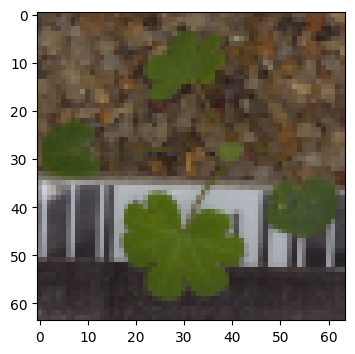

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 544ms/step
Predicted Label ['Small-flowered Cranesbill']
True Label Small-flowered Cranesbill


In [ ]:
# Visualizing the predicted and correct label of images from test data
plt.figure(figsize=(4,4))
plt.imshow(X_test[2])
plt.show()
## Complete the code to predict the test data using the final model selected
print('Predicted Label', enc.inverse_transform(model3.predict((X_test_normalized[2].reshape(1,64,64,3)))))   # reshaping the input image as we are only trying to predict using a single image
print('True Label', enc.inverse_transform(y_test_encoded)[2])

Lets observe how well it can predict a few more after recognizing a category of images from the 12 that it was trained to recognize:

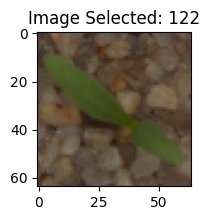

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
Image 122 - Predicted Label: Black-grass, True Label: Sugar beet


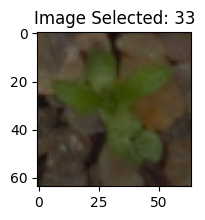

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
Image 33 - Predicted Label: Black-grass, True Label: Scentless Mayweed


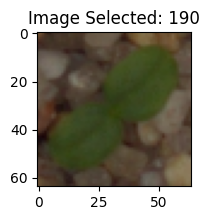

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
Image 190 - Predicted Label: Black-grass, True Label: Cleavers


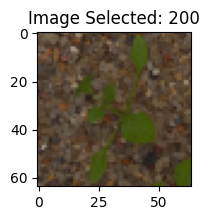

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
Image 200 - Predicted Label: Black-grass, True Label: Common Chickweed


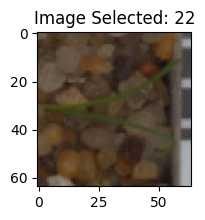

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
Image 22 - Predicted Label: Black-grass, True Label: Loose Silky-bent


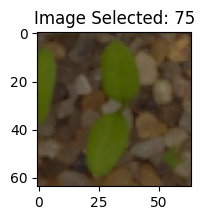

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
Image 75 - Predicted Label: Black-grass, True Label: Common Chickweed


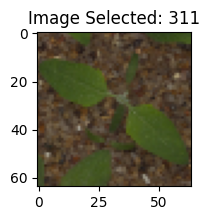

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
Image 311 - Predicted Label: Black-grass, True Label: Fat Hen


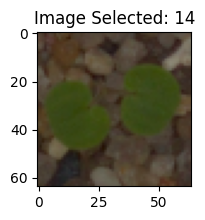

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
Image 14 - Predicted Label: Black-grass, True Label: Small-flowered Cranesbill


In [ ]:
# Now, display several images to compare predictions using ouu "Best" model
indices = [122, 33, 190, 200, 22, 75, 311, 14]  # Selected indices of images to display

# Loop over each image index and display the image with its prediction and true label
for idx in indices:
    # Visualizing the image
    plt.figure(figsize=(2, 2))
    plt.imshow(X_test[idx])
    plt.title(f"Image Selected: {idx}")
    plt.show()

    # Get predicted label for the image
    prediction = model3.predict(X_test_normalized[idx].reshape(1, 64, 64, 3))  # Model prediction

    # Convert prediction to a 1D array and apply argmax to get the predicted class index
    predicted_class_idx = np.argmax(prediction, axis=-1)  # Apply argmax to get class index

    # Inverse transform the predicted label index to get the label name
    predicted_label = enc.inverse_transform(predicted_class_idx.reshape(1, -1))[0]  # Reshape to pass as 2D array

    # Get the true label for the image
    true_label = enc.inverse_transform(y_test_encoded[idx].reshape(1, -1))[0]  # Reshape true label

    # Print predicted and true labels
    print(f"Image {idx} - Predicted Label: \033[1;33m{predicted_label}\033[0m, True Label: \033[1;32m{true_label}\033[0m")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


Using VGG16 Untrained - 'out of the box':



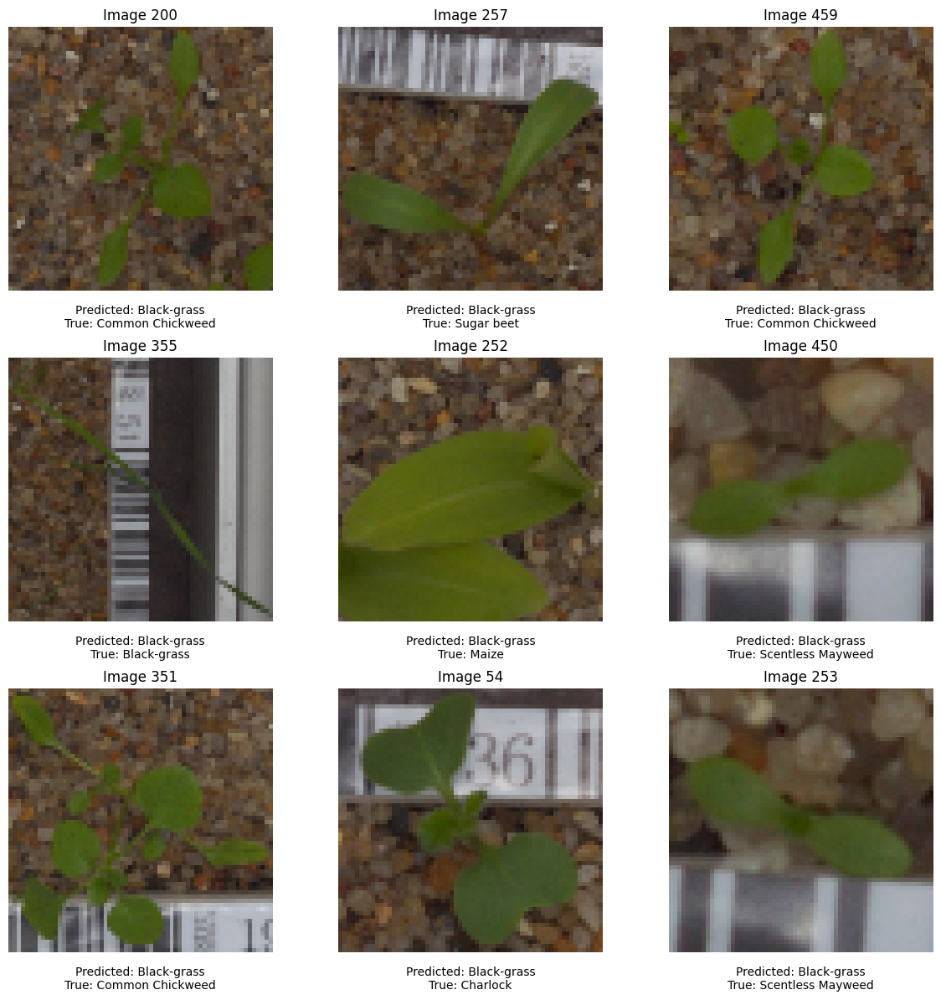

In [ ]:
import matplotlib.pyplot as plt
import numpy as np


# List of image indices to display and compare
indices = [200, 257, 459, 355, 252, 450, 351, 54, 253]  # 9 images

# Define the number of columns and rows
num_columns = 3
num_rows = 3  # 3 rows and 3 columns for 9 images

# Create a figure with subplots
fig, axes = plt.subplots(num_rows, num_columns, figsize=(12, 12))  # Adjust the figsize to fit 9 images

# Loop over each image index and display the image with its prediction and true label
for idx, ax in zip(indices, axes.flat):
    # Visualizing the image
    ax.imshow(X_test[idx])
    ax.set_title(f"Image {idx}")
    ax.axis('off')  # Hide axes for a cleaner display

    # Get predicted label for the image
    prediction = model_vgg16.predict(X_test_normalized[idx].reshape(1, 64, 64, 3))  # Model prediction
    predicted_class_idx = np.argmax(prediction, axis=-1)  # Apply argmax to get class index
    predicted_label = enc.inverse_transform(predicted_class_idx.reshape(1, -1))[0]  # Inverse transform to label

    # Get the true label for the image
    true_label = enc.inverse_transform(y_test_encoded[idx].reshape(1, -1))[0]  # Inverse transform to label

    # Display the predicted and true labels as text below the image
    ax.text(0.5, -0.1, f"Predicted: {predicted_label}\nTrue: {true_label}",
            ha='center', va='center', transform=ax.transAxes, fontsize=10)


print("\n\nUsing VGG16 Untrained - 'out of the box':\n")

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
Using Trained Model2 :


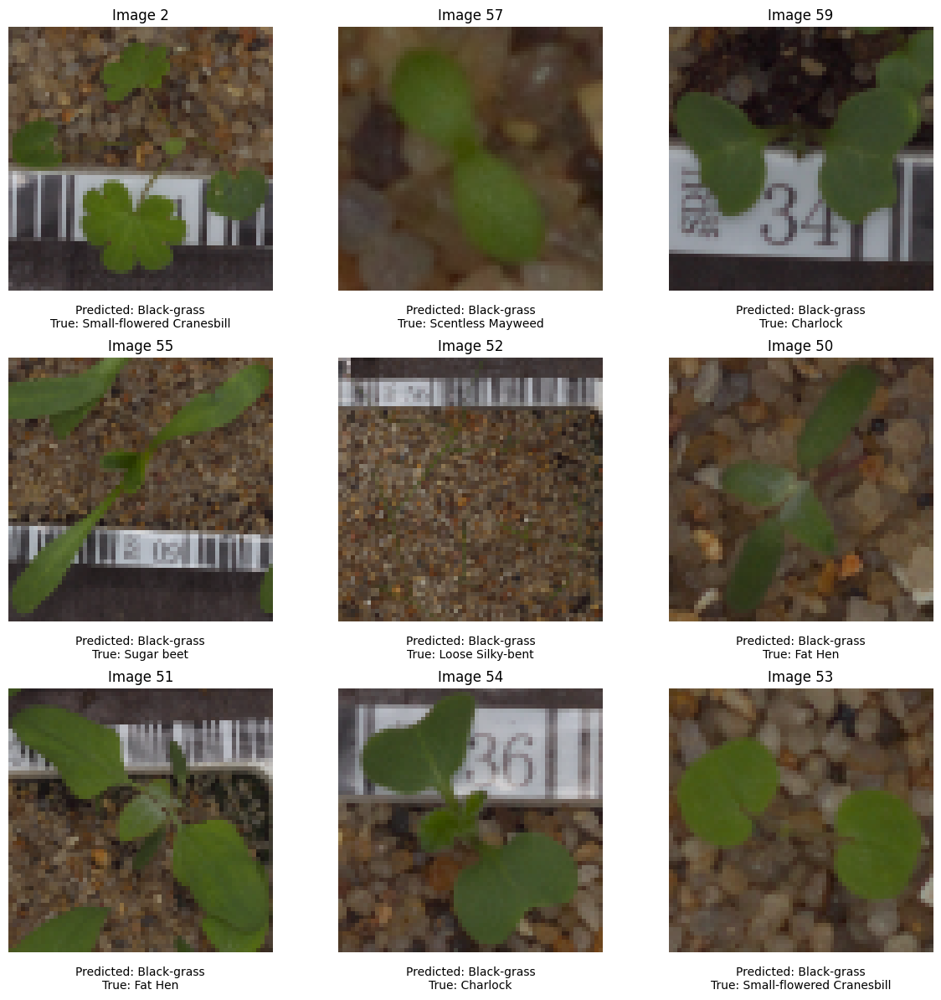

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# List of image indices to display and compare
indices = [2, 57, 59, 55, 52, 50, 51, 54, 53]  # 9 images

# Define the number of columns and rows
num_columns = 3
num_rows = 3  # 3 rows and 3 columns for 9 images

# Create a figure with subplots
fig, axes = plt.subplots(num_rows, num_columns, figsize=(12, 12))  # Adjust the figsize to fit 9 images

# Loop over each image index and display the image with its prediction and true label
for idx, ax in zip(indices, axes.flat):
    # Visualizing the image
    ax.imshow(X_test[idx])
    ax.set_title(f"Image {idx}")
    ax.axis('off')  # Hide axes for a cleaner display

    # Get predicted label for the image
    prediction = model2.predict(X_test_normalized[idx].reshape(1, 64, 64, 3))  # Model prediction
    predicted_class_idx = np.argmax(prediction, axis=-1)  # Apply argmax to get class index
    predicted_label = enc.inverse_transform(predicted_class_idx.reshape(1, -1))[0]  # Inverse transform to label

    # Get the true label for the image
    true_label = enc.inverse_transform(y_test_encoded[idx].reshape(1, -1))[0]  # Inverse transform to label

    # Display the predicted and true labels as text below the image
    ax.text(0.5, -0.1, f"Predicted: {predicted_label}\nTrue: {true_label}",
            ha='center', va='center', transform=ax.transAxes, fontsize=10)

print("Using Trained Model2 :")

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()

EXTRA CREDIT

In [ ]:
# (Frozen) VGG16 TRAINING WITH OUR SET OF IMAGES

import tensorflow as tf
from tensorflow.keras.applications import VGG16
from tensorflow.keras.layers import Input, Flatten, Dense, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

# Assuming X_train_normalized, y_train_encoded, X_val_normalized, y_val_encoded, and learning_rate_reduction are defined from previous code

# Define the input shape
input_tensor = Input(shape=(64, 64, 3))

# Load the VGG16 model without the top layers, using the functional API
vgg16_base = VGG16(weights='imagenet', include_top=False, input_tensor=input_tensor)

# Freeze the VGG16 base layers
for layer in vgg16_base.layers:
    layer.trainable = False

# Add custom layers on top of the VGG16 base model
x = Flatten()(vgg16_base.output)
x = Dense(2048, activation='relu')(x)
x = Dropout(0.5)(x)
x = Dense(2048, activation='relu')(x)
x = Dropout(0.5)(x)
output = Dense(12, activation='softmax')(x)  # Output layer for 12 classes

# Define the complete model
model_vgg16 = Model(inputs=input_tensor, outputs=output)

# Compile the model
opt = Adam()
model_vgg16.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['accuracy'])

# Display the model summary
model_vgg16.summary()

# Parameters for training
epochs = 50
batch_size = 64

# Assuming train_datagen is defined from previous code
history_vgg16 = model_vgg16.fit(
    train_datagen.flow(X_train_normalized, y_train_encoded, batch_size=batch_size, shuffle=False),
    epochs=epochs,
    steps_per_epoch=X_train_normalized.shape[0] // batch_size,
    validation_data=(X_val_normalized, y_val_encoded),
    verbose=1,
    callbacks=[learning_rate_reduction]
)

Model: "functional_61"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_9 (InputLayer)           │ (None, 64, 64, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, 64, 64, 64)          │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv2 (Conv2D)                │ (None, 64, 64, 64)          │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_pool (MaxPooling2D)           │ (None, 32, 32, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv1 (Conv2D)                │ (None, 32, 32, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv2 (Conv2D)                │ (None, 32, 32, 128)         │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_pool (MaxPooling2D)           │ (None, 16, 16, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv1 (Conv2D)                │ (None, 16, 16, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv2 (Conv2D)                │ (None, 16, 16, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv3 (Conv2D)                │ (None, 16, 16, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_pool (MaxPooling2D)           │ (None, 8, 8, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv1 (Conv2D)                │ (None, 8, 8, 512)           │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv2 (Conv2D)                │ (None, 8, 8, 512)           │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv3 (Conv2D)                │ (None, 8, 8, 512)           │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_pool (MaxPooling2D)           │ (None, 4, 4, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv1 (Conv2D)                │ (None, 4, 4, 512)           │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv2 (Conv2D)                │ (None, 4, 4, 512)           │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv3 (Conv2D)                │ (None, 4, 4, 512)           │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_pool (MaxPooling2D)           │ (None, 2, 2, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_9 (Flatten)                  │ (None, 2048)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_23 (Dense)                     │ (None, 2048)                │       4,196,352 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 23,131,980 (88.24 MB)

 Trainable params: 8,417,292 (32.11 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

Epoch 1/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - accuracy: 0.1954 - loss: 2.5865 - val_accuracy: 0.3726 - val_loss: 1.7239 - learning_rate: 0.0010
Epoch 2/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.2344 - loss: 2.0087 - val_accuracy: 0.4042 - val_loss: 1.7266 - learning_rate: 0.0010
Epoch 3/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.3934 - loss: 1.7049 - val_accuracy: 0.4505 - val_loss: 1.6094 - learning_rate: 0.0010
Epoch 4/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.3906 - loss: 1.8359 - val_accuracy: 0.4905 - val_loss: 1.5507 - learning_rate: 0.0010
Epoch 5/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - accuracy: 0.4487 - loss: 1.5540 - val_accuracy: 0.4758 - val_loss: 1.4968 - learning_rate: 0.0010
Epoch 6/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.3906 - loss: 1.5349 - val_accuracy: 0.4611 - val_loss: 1.4951 - learning_rate: 0.0010
Epoch 7/50
59/59 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - accuracy: 0.4935 - loss: 1.4241 - val_accur

Observations:
- A frozen layers VGG16 <font color = violet>did not </font>give us better performance with higher accuracy than model 3.
- Perhaps if we train the model with our smaller images dataset we could see if it improves its performance.
- We will therefore adjust hyperparameters on the "best' performing model: <font color=violet>model3</font>

## Fine-tuning Model3 for improved accuracy

In [ ]:
# Fine-tuning Model3 for improved accuracy

# Data Augmentation
from tensorflow.keras.preprocessing.image import ImageDataGenerator

train_datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

train_datagen.fit(X_train_normalized)


# Adjust hyperparameters
epochs = 75  # Increased epochs
batch_size = 32  # Reduced batch size
learning_rate = 0.0001 # Reduced learning rate

opt = Adam(learning_rate=learning_rate) #Update the optimizer
model3.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['accuracy'])

# Retrain the model
history_3 = model3.fit(
    train_datagen.flow(X_train_normalized, y_train_encoded, batch_size=batch_size),
    epochs=epochs,
    validation_data=(X_val_normalized, y_val_encoded),
    verbose=1,
    callbacks=[learning_rate_reduction] # Assuming learning_rate_reduction is defined
)

# Evaluate the fine-tuned model
loss, accuracy = model3.evaluate(X_test_normalized, y_test_encoded, verbose=0)
print(f"Fine-tuned Model3 Test Loss: {loss:.4f}")
print(f"Fine-tuned Model3 Test Accuracy: {accuracy:.4f}")

# Further analysis and potential improvements
# 1. Learning rate scheduling: Implement a more sophisticated learning rate schedule (e.g., ReduceLROnPlateau)
# 2. Regularization: Experiment with L1 or L2 regularization or different dropout rates.
# 3. Network architecture:  Consider adding more layers or changing the filter sizes in the convolutional layers.
# 4. Data preprocessing: Investigate other normalization/standardization techniques.


Epoch 1/75
119/119 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - accuracy: 0.5067 - loss: 1.5207 - val_accuracy: 0.7326 - val_loss: 0.9064 - learning_rate: 1.0000e-04
Epoch 2/75
119/119 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - accuracy: 0.5241 - loss: 1.4642 - val_accuracy: 0.7432 - val_loss: 0.9072 - learning_rate: 1.0000e-04
Epoch 3/75
119/119 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - accuracy: 0.5562 - loss: 1.3728 - val_accuracy: 0.6716 - val_loss: 1.0823 - learning_rate: 1.0000e-04
Epoch 4/75
119/119 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - accuracy: 0.5272 - loss: 1.4310 - val_accuracy: 0.7326 - val_loss: 0.8816 - learning_rate: 1.0000e-04
Epoch 5/75
117/119 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - accuracy: 0.5502 - loss: 1.3666
Epoch 5: ReduceLROnPlateau reducing learning rate to 4.999999873689376e-05.
119/119 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - accuracy: 0.5505 - loss: 1.3661 - val_accuracy: 0.6484 - val_loss: 1.0311 - learning_rate: 1.0000e-04
Epoch 6/75
119/119 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - accurac

Observations:
- Not much of an improvement with the model3 performance as its accuracy <font color=violet>did not significantly improve</font>.
- However, this was a great learning exercise!!

# Actionable Insights and Business Recommendations

The overall objective of building Convolutional Neural Network Models for this project was:
*  To identify plant seedlings faster by the use of AI and Deep Learning.

**SUMMARY & RECOMMENDATIONS:**
*  The various models built ranged in accuracy but best results were in the 65%-70% range.
*  I explored 4 models and included a 5th with VGG16.
*  Some models fared better thann the others but were pretty close to one another with their predictions.
*  The VGG16 model was include as EXTRA CREDIT :-)
*  One model was selected based on its best overall accuracy and simpler (fewer layers) topology and was further optimized and fine-tuned.
*  The "best" model predicted plant identification with a 30% failure rate.
*  For 4,750 plants - identifying them correctly into one of the 12 categories was a 60-90 second effort costing mostly the processing power at model fit execution.
*  However, I had 12 random plants selected, identified and compared with the true plant labels and these 12, were incorrectly identified. I tried a second time and got the same results.  This leads me to believe that we must improve the accuracy of the models either by augmenting the layers, number of neurons, and more importantly: augmenting the samples of the minority classes to create a better classification category balance.
*  A significant increase with the number of samples will help improve the ability of the models to identify and predict the proper classifications.


*  Additianal strategies for improving image model prediction accuracy:

	1.	<font color=violet>**Data Enhancements:**</font>
	•	Add Samples: More labeled images improve generalization.
	•	Data Augmentation: Apply transformations to expand the dataset.
	•	Balance Classes: Use oversampling, undersampling, or synthetic data.
	2.	<font color=violet>**Model Architecture Tweaks:**</font>
	•	Add Neurons/Layers: Increases capacity, but watch for overfitting.
	•	Use Pretrained Models: Fine-tune models like ResNet for stronger results.
	•	Ensemble Models: Combine models for more stable predictions.
	3.	<font color=violet>**Training and Regularization:**</font>
	•	Tune Hyperparameters: Adjust learning rates, batch sizes, optimizers.
	•	Regularization: Add dropout, batch normalization to avoid overfitting.
	•	Increase Epochs: Train longer with early stopping to avoid overfitting.
	4.	<font color=violet>**Advanced Techniques:**</font>
	•	Add Attention Layers: Focus on important image regions.
	•	Fine-Tune Pretrained Layers: Freeze lower layers, adjust top layers.
	•	Self-Supervised Learning: Pre-train with unlabeled data, then fine-tune.



---
                                                                  END
